In [1]:
from __future__ import print_function
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Взводим руками рандом сид для воспроизводимости обучения
manualSeed = 333
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  333


In [2]:
# Директория с датасетом покемонов. Внимание!!! Чтобы даталоадер работал, необходимо положить картинки в 
# папку по типу .../pokemon/1/0.png, .../pokemon/1/1.png и т.д. Без этого даталоадер работать не будет
dataroot = "./pokemon/"

# Количество воркеров для даталоадера
workers = 1

# Размер батча для обучения
batch_size = 64

# Размер скрытого вектора z. Было бы интересно его увеличить, но я не уверен, что станет лучше.
num_hidden = 100

# Число каналов изображения
num_channels = 3

# Размер карт в генераторе
num_g_f = 64

# Размер карт в дискриминаторе
num_d_f = 64

# Число итераций обучения дискриминатора, приходящихся на одну итерацию обучения генератора
n_d_train = 5

# Кол-во эпох обучения
num_epochs = 1000

Current device : cuda:1


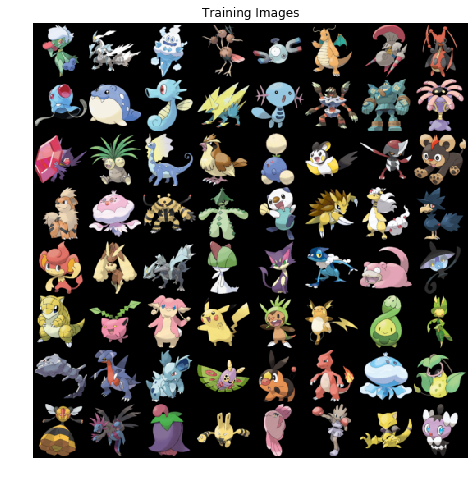

In [3]:
# Выставляем размер картинок
image_size = 64
# Создаем даталоадер
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# переключаемся на куду
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

print("Current device : {}".format(device))

# Выведем трейнсет, дабы убедиться, что все завелось
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [4]:
# функция для инициализации весов из статьи про GAN
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
# Генератор

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # d := image_size, for brevity
            # input: batch_size x num_hidden -->
            nn.ConvTranspose2d(
                in_channels=num_hidden,
                out_channels=num_g_f * 8, 
                kernel_size=4, 
                stride=1, 
                padding=0, 
                bias=False
            ),
            nn.BatchNorm2d(num_g_f * 8),
            nn.ReLU(inplace=True),
            # input: batch_size x (8*num_g_f) x 4 x 4 --> 
            nn.ConvTranspose2d(
                in_channels=num_g_f * 8,
                out_channels=num_g_f * 4, 
                kernel_size=4, 
                stride=2, 
                padding=1, 
                bias=False
            ),
            nn.BatchNorm2d(num_g_f * 4),
            nn.ReLU(inplace=True),
            # input: batch_size x (4*num_g_f) x 8 x 8 --> 
            nn.ConvTranspose2d(
                in_channels=num_g_f * 4, 
                out_channels=num_g_f * 2,
                kernel_size=4,
                stride=2,
                padding=1, 
                bias=False
            ),
            nn.BatchNorm2d(num_g_f * 2),
            nn.ReLU(inplace=True),
            # input: batch_size x (4*num_g_f) x 16 x 16 -->
            nn.ConvTranspose2d(
                in_channels=num_g_f * 2,
                out_channels=num_g_f,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(num_g_f),
            nn.ReLU(inplace=True),
            # input: batch_size x num_g_f x 32 x 32 -->
            nn.ConvTranspose2d(
                in_channels=num_g_f, 
                out_channels=num_channels, 
                kernel_size=4, 
                stride=2, 
                padding=1, 
                bias=False
            ),
            nn.Tanh()
            # output: batch_size x 3 x 64 x 64
        )

    def forward(self, input):
        return self.net(input)

In [8]:
# Дискриминатор
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # input: batch_size x 3 x 64 x 64 -->
            nn.Conv2d(
                in_channels=num_channels, 
                out_channels=num_d_f, 
                kernel_size=4, 
                stride=2, 
                padding=1, 
                bias=False
            ),
            nn.LeakyReLU(0.2, inplace=True),
            # input: batch_size x num_d_f x 32 x 32 -->
            nn.Conv2d(
                in_channels=num_d_f,
                out_channels=num_d_f * 2,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(num_d_f * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # input: batch_size x (num_d_f*2) x 16 x 16 -->
            nn.Conv2d(
                in_channels=num_d_f * 2,
                out_channels=num_d_f * 4,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(num_d_f * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # input: batch_size x (num_d_f*4) x 8 x 8 -->
            nn.Conv2d(
                in_channels=num_d_f * 4,
                out_channels=num_d_f * 8,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(num_d_f * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # input: batch_size x (num_d_f*8) x 4 x 4
            nn.Conv2d(
                in_channels=num_d_f * 8,
                out_channels=1,
                kernel_size=4,
                stride=1,
                padding=0,
                bias=False
            )
        )

    def forward(self, input):
        return self.net(input)

Generator(
  (net): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)
Discriminator(
  (net

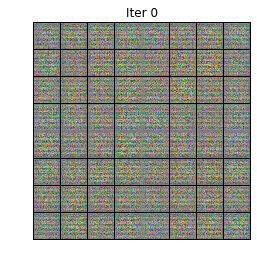

[0/1000][1/13]	Loss_D: -0.0355	Loss_G: 0.0003
[0/1000][2/13]	Loss_D: -0.0369	Loss_G: -0.0049
[0/1000][3/13]	Loss_D: -0.0422	Loss_G: -0.0085
[0/1000][4/13]	Loss_D: -0.0397	Loss_G: -0.0102
[0/1000][5/13]	Loss_D: -0.0429	Loss_G: -0.0077
[0/1000][6/13]	Loss_D: -0.0492	Loss_G: -0.0061
[0/1000][7/13]	Loss_D: -0.0480	Loss_G: -0.0021
[0/1000][8/13]	Loss_D: -0.0545	Loss_G: 0.0002
[0/1000][9/13]	Loss_D: -0.0571	Loss_G: 0.0058
[0/1000][10/13]	Loss_D: -0.0638	Loss_G: 0.0117
[0/1000][11/13]	Loss_D: -0.0723	Loss_G: 0.0178
[0/1000][12/13]	Loss_D: -0.0806	Loss_G: 0.0263


/home/vv.ivanov/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type Generator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/vv.ivanov/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type Discriminator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


[1/1000][0/13]	Loss_D: -0.0835	Loss_G: 0.0353
[1/1000][1/13]	Loss_D: -0.0954	Loss_G: 0.0463
[1/1000][2/13]	Loss_D: -0.1175	Loss_G: 0.0581
[1/1000][3/13]	Loss_D: -0.1355	Loss_G: 0.0867
[1/1000][4/13]	Loss_D: -0.1655	Loss_G: 0.0753
[1/1000][5/13]	Loss_D: -0.1829	Loss_G: 0.1318
[1/1000][6/13]	Loss_D: -0.2131	Loss_G: 0.1066
[1/1000][7/13]	Loss_D: -0.2176	Loss_G: 0.1727
[1/1000][8/13]	Loss_D: -0.2604	Loss_G: 0.1233
[1/1000][9/13]	Loss_D: -0.2652	Loss_G: 0.2043
[1/1000][10/13]	Loss_D: -0.2929	Loss_G: 0.1380
[1/1000][11/13]	Loss_D: -0.2800	Loss_G: 0.2315
[1/1000][12/13]	Loss_D: -0.2943	Loss_G: 0.1393
[2/1000][0/13]	Loss_D: -0.2881	Loss_G: 0.2417
[2/1000][1/13]	Loss_D: -0.3143	Loss_G: 0.1280
[2/1000][2/13]	Loss_D: -0.3200	Loss_G: 0.2468
[2/1000][3/13]	Loss_D: -0.3241	Loss_G: 0.1251
[2/1000][4/13]	Loss_D: -0.3280	Loss_G: 0.2402
[2/1000][5/13]	Loss_D: -0.3302	Loss_G: 0.1043
[2/1000][6/13]	Loss_D: -0.3101	Loss_G: 0.2328
[2/1000][7/13]	Loss_D: -0.3195	Loss_G: 0.1108
[2/1000][8/13]	Loss_D: -0.2995	

[14/1000][7/13]	Loss_D: -1.3542	Loss_G: 0.6770
[14/1000][8/13]	Loss_D: -1.3627	Loss_G: 0.7156
[14/1000][9/13]	Loss_D: -1.2988	Loss_G: 0.5693
[14/1000][10/13]	Loss_D: -1.3457	Loss_G: 0.6736
[14/1000][11/13]	Loss_D: -1.2380	Loss_G: 0.7034
[14/1000][12/13]	Loss_D: -1.4039	Loss_G: 0.7073
[15/1000][0/13]	Loss_D: -1.3754	Loss_G: 0.6764
[15/1000][1/13]	Loss_D: -1.4022	Loss_G: 0.7083
[15/1000][2/13]	Loss_D: -1.3916	Loss_G: 0.6962
[15/1000][3/13]	Loss_D: -1.4015	Loss_G: 0.7083
[15/1000][4/13]	Loss_D: -1.4025	Loss_G: 0.6968
[15/1000][5/13]	Loss_D: -1.3853	Loss_G: 0.7057
[15/1000][6/13]	Loss_D: -1.4119	Loss_G: 0.7080
[15/1000][7/13]	Loss_D: -1.3703	Loss_G: 0.6987
[15/1000][8/13]	Loss_D: -1.3558	Loss_G: 0.6640
[15/1000][9/13]	Loss_D: -1.3898	Loss_G: 0.7060
[15/1000][10/13]	Loss_D: -1.3654	Loss_G: 0.6946
[15/1000][11/13]	Loss_D: -1.4100	Loss_G: 0.7098
[15/1000][12/13]	Loss_D: -1.4114	Loss_G: 0.7015
[16/1000][0/13]	Loss_D: -1.3922	Loss_G: 0.7075
[16/1000][1/13]	Loss_D: -1.4042	Loss_G: 0.7021
[16/100

[27/1000][12/13]	Loss_D: -1.4294	Loss_G: 0.7237
[28/1000][0/13]	Loss_D: -1.4412	Loss_G: 0.7238
[28/1000][1/13]	Loss_D: -1.4488	Loss_G: 0.7232
[28/1000][2/13]	Loss_D: -1.4616	Loss_G: 0.7300
[28/1000][3/13]	Loss_D: -1.4550	Loss_G: 0.7230
[28/1000][4/13]	Loss_D: -1.4370	Loss_G: 0.7191
[28/1000][5/13]	Loss_D: -1.3766	Loss_G: 0.6839
[28/1000][6/13]	Loss_D: -1.4333	Loss_G: 0.7224
[28/1000][7/13]	Loss_D: -1.4479	Loss_G: 0.7263
[28/1000][8/13]	Loss_D: -1.4380	Loss_G: 0.7169
[28/1000][9/13]	Loss_D: -1.4338	Loss_G: 0.7206
[28/1000][10/13]	Loss_D: -1.4463	Loss_G: 0.7182
[28/1000][11/13]	Loss_D: -1.4019	Loss_G: 0.7061
[28/1000][12/13]	Loss_D: -1.4327	Loss_G: 0.7215
[29/1000][0/13]	Loss_D: -1.4612	Loss_G: 0.7276
[29/1000][1/13]	Loss_D: -1.4350	Loss_G: 0.7189
[29/1000][2/13]	Loss_D: -1.4491	Loss_G: 0.7258
[29/1000][3/13]	Loss_D: -1.4558	Loss_G: 0.7257
[29/1000][4/13]	Loss_D: -1.4106	Loss_G: 0.7168
[29/1000][5/13]	Loss_D: -1.4504	Loss_G: 0.7250
[29/1000][6/13]	Loss_D: -1.4582	Loss_G: 0.7301
[29/1000]

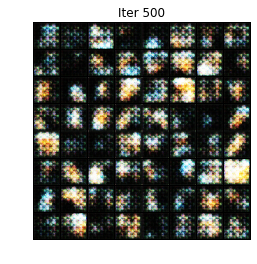

[38/1000][7/13]	Loss_D: -1.4554	Loss_G: 0.7258
[38/1000][8/13]	Loss_D: -1.4645	Loss_G: 0.7304
[38/1000][9/13]	Loss_D: -1.4423	Loss_G: 0.7212
[38/1000][10/13]	Loss_D: -1.4610	Loss_G: 0.7319
[38/1000][11/13]	Loss_D: -1.4620	Loss_G: 0.7290
[38/1000][12/13]	Loss_D: -1.4495	Loss_G: 0.7239
[39/1000][0/13]	Loss_D: -1.4678	Loss_G: 0.7330
[39/1000][1/13]	Loss_D: -1.4615	Loss_G: 0.7267
[39/1000][2/13]	Loss_D: -1.4178	Loss_G: 0.7204
[39/1000][3/13]	Loss_D: -1.4277	Loss_G: 0.7219
[39/1000][4/13]	Loss_D: -1.4458	Loss_G: 0.7191
[39/1000][5/13]	Loss_D: -1.4408	Loss_G: 0.7223
[39/1000][6/13]	Loss_D: -1.4162	Loss_G: 0.7192
[39/1000][7/13]	Loss_D: -1.4359	Loss_G: 0.7242
[39/1000][8/13]	Loss_D: -1.4312	Loss_G: 0.7211
[39/1000][9/13]	Loss_D: -1.4371	Loss_G: 0.7211
[39/1000][10/13]	Loss_D: -1.4348	Loss_G: 0.7175
[39/1000][11/13]	Loss_D: -1.3948	Loss_G: 0.7250
[39/1000][12/13]	Loss_D: -1.3601	Loss_G: 0.7101
[40/1000][0/13]	Loss_D: -1.4451	Loss_G: 0.7212
[40/1000][1/13]	Loss_D: -1.4567	Loss_G: 0.7262
[40/100

[51/1000][12/13]	Loss_D: -1.4326	Loss_G: 0.7215
[52/1000][0/13]	Loss_D: -1.4337	Loss_G: 0.7249
[52/1000][1/13]	Loss_D: -1.4385	Loss_G: 0.7194
[52/1000][2/13]	Loss_D: -1.4146	Loss_G: 0.7116
[52/1000][3/13]	Loss_D: -1.2979	Loss_G: 0.5907
[52/1000][4/13]	Loss_D: -1.3184	Loss_G: 0.7173
[52/1000][5/13]	Loss_D: -1.1549	Loss_G: 0.6639
[52/1000][6/13]	Loss_D: -1.4287	Loss_G: 0.7173
[52/1000][7/13]	Loss_D: -1.4280	Loss_G: 0.7177
[52/1000][8/13]	Loss_D: -1.4287	Loss_G: 0.7230
[52/1000][9/13]	Loss_D: -1.4351	Loss_G: 0.7187
[52/1000][10/13]	Loss_D: -1.4304	Loss_G: 0.7209
[52/1000][11/13]	Loss_D: -1.4434	Loss_G: 0.7208
[52/1000][12/13]	Loss_D: -1.4278	Loss_G: 0.7192
[53/1000][0/13]	Loss_D: -1.4365	Loss_G: 0.7171
[53/1000][1/13]	Loss_D: -1.4105	Loss_G: 0.7056
[53/1000][2/13]	Loss_D: -1.4078	Loss_G: 0.7197
[53/1000][3/13]	Loss_D: -1.4320	Loss_G: 0.7161
[53/1000][4/13]	Loss_D: -1.4208	Loss_G: 0.7191
[53/1000][5/13]	Loss_D: -1.4463	Loss_G: 0.7154
[53/1000][6/13]	Loss_D: -1.4430	Loss_G: 0.7245
[53/1000]

[65/1000][4/13]	Loss_D: -1.4501	Loss_G: 0.7256
[65/1000][5/13]	Loss_D: -1.4503	Loss_G: 0.7296
[65/1000][6/13]	Loss_D: -1.4473	Loss_G: 0.7248
[65/1000][7/13]	Loss_D: -1.4533	Loss_G: 0.7298
[65/1000][8/13]	Loss_D: -1.4555	Loss_G: 0.7240
[65/1000][9/13]	Loss_D: -1.4589	Loss_G: 0.7289
[65/1000][10/13]	Loss_D: -1.4570	Loss_G: 0.7259
[65/1000][11/13]	Loss_D: -1.4489	Loss_G: 0.7284
[65/1000][12/13]	Loss_D: -1.4588	Loss_G: 0.7284
[66/1000][0/13]	Loss_D: -1.4530	Loss_G: 0.7265
[66/1000][1/13]	Loss_D: -1.4505	Loss_G: 0.7260
[66/1000][2/13]	Loss_D: -1.4502	Loss_G: 0.7262
[66/1000][3/13]	Loss_D: -1.4475	Loss_G: 0.7243
[66/1000][4/13]	Loss_D: -1.4317	Loss_G: 0.7076
[66/1000][5/13]	Loss_D: -1.3086	Loss_G: 0.0822
[66/1000][6/13]	Loss_D: -0.8346	Loss_G: 0.7023
[66/1000][7/13]	Loss_D: -1.3589	Loss_G: 0.7166
[66/1000][8/13]	Loss_D: -1.3609	Loss_G: 0.6912
[66/1000][9/13]	Loss_D: -1.4340	Loss_G: 0.7237
[66/1000][10/13]	Loss_D: -1.4521	Loss_G: 0.7267
[66/1000][11/13]	Loss_D: -1.4560	Loss_G: 0.7272
[66/1000

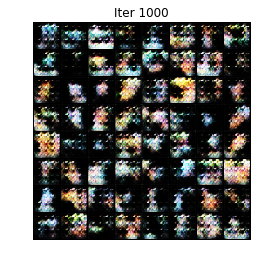

[77/1000][0/13]	Loss_D: -1.4528	Loss_G: 0.7276
[77/1000][1/13]	Loss_D: -1.4724	Loss_G: 0.7338
[77/1000][2/13]	Loss_D: -1.4639	Loss_G: 0.7264
[77/1000][3/13]	Loss_D: -1.4400	Loss_G: 0.7252
[77/1000][4/13]	Loss_D: -1.4549	Loss_G: 0.7215
[77/1000][5/13]	Loss_D: -1.4546	Loss_G: 0.7298
[77/1000][6/13]	Loss_D: -1.4413	Loss_G: 0.7136
[77/1000][7/13]	Loss_D: -1.4517	Loss_G: 0.7280
[77/1000][8/13]	Loss_D: -1.4325	Loss_G: 0.7039
[77/1000][9/13]	Loss_D: -0.5905	Loss_G: -0.3836
[77/1000][10/13]	Loss_D: -0.7462	Loss_G: 0.3610
[77/1000][11/13]	Loss_D: -1.1635	Loss_G: 0.6641
[77/1000][12/13]	Loss_D: -1.3948	Loss_G: 0.7006
[78/1000][0/13]	Loss_D: -1.3920	Loss_G: 0.7035
[78/1000][1/13]	Loss_D: -1.4347	Loss_G: 0.7234
[78/1000][2/13]	Loss_D: -1.4410	Loss_G: 0.7167
[78/1000][3/13]	Loss_D: -1.4321	Loss_G: 0.7176
[78/1000][4/13]	Loss_D: -1.4420	Loss_G: 0.7192
[78/1000][5/13]	Loss_D: -1.4401	Loss_G: 0.7197
[78/1000][6/13]	Loss_D: -1.4411	Loss_G: 0.7206
[78/1000][7/13]	Loss_D: -1.4425	Loss_G: 0.7221
[78/1000]

[90/1000][5/13]	Loss_D: -0.9550	Loss_G: 0.7242
[90/1000][6/13]	Loss_D: -1.3240	Loss_G: 0.6868
[90/1000][7/13]	Loss_D: -1.3746	Loss_G: 0.6948
[90/1000][8/13]	Loss_D: -1.3802	Loss_G: 0.6951
[90/1000][9/13]	Loss_D: -1.3746	Loss_G: 0.7059
[90/1000][10/13]	Loss_D: -1.3698	Loss_G: 0.6942
[90/1000][11/13]	Loss_D: -1.3910	Loss_G: 0.6960
[90/1000][12/13]	Loss_D: -1.3472	Loss_G: 0.6957
[91/1000][0/13]	Loss_D: -1.3719	Loss_G: 0.7016
[91/1000][1/13]	Loss_D: -1.3578	Loss_G: 0.6886
[91/1000][2/13]	Loss_D: -1.3317	Loss_G: 0.7129
[91/1000][3/13]	Loss_D: -1.3810	Loss_G: 0.7012
[91/1000][4/13]	Loss_D: -1.3783	Loss_G: 0.6915
[91/1000][5/13]	Loss_D: -1.1112	Loss_G: 0.7066
[91/1000][6/13]	Loss_D: -1.0472	Loss_G: 0.6213
[91/1000][7/13]	Loss_D: -1.3424	Loss_G: 0.6896
[91/1000][8/13]	Loss_D: -1.3639	Loss_G: 0.6959
[91/1000][9/13]	Loss_D: -1.3692	Loss_G: 0.6913
[91/1000][10/13]	Loss_D: -1.3536	Loss_G: 0.6946
[91/1000][11/13]	Loss_D: -1.3630	Loss_G: 0.6988
[91/1000][12/13]	Loss_D: -1.3818	Loss_G: 0.6974
[92/100

[103/1000][9/13]	Loss_D: -1.3025	Loss_G: 0.6634
[103/1000][10/13]	Loss_D: -1.2810	Loss_G: 0.6574
[103/1000][11/13]	Loss_D: -1.3098	Loss_G: 0.6775
[103/1000][12/13]	Loss_D: -1.3271	Loss_G: 0.6731
[104/1000][0/13]	Loss_D: -1.3251	Loss_G: 0.6643
[104/1000][1/13]	Loss_D: -1.3089	Loss_G: 0.6766
[104/1000][2/13]	Loss_D: -1.3256	Loss_G: 0.6661
[104/1000][3/13]	Loss_D: -1.3343	Loss_G: 0.6841
[104/1000][4/13]	Loss_D: -1.3041	Loss_G: 0.6572
[104/1000][5/13]	Loss_D: -1.3045	Loss_G: 0.6717
[104/1000][6/13]	Loss_D: -1.2907	Loss_G: 0.6790
[104/1000][7/13]	Loss_D: -1.3303	Loss_G: 0.6695
[104/1000][8/13]	Loss_D: -1.2556	Loss_G: 0.6947
[104/1000][9/13]	Loss_D: -0.8298	Loss_G: 0.3558
[104/1000][10/13]	Loss_D: -0.5101	Loss_G: 0.6817
[104/1000][11/13]	Loss_D: -1.2678	Loss_G: 0.6402
[104/1000][12/13]	Loss_D: -1.3048	Loss_G: 0.6589
[105/1000][0/13]	Loss_D: -1.3165	Loss_G: 0.6802
[105/1000][1/13]	Loss_D: -1.3179	Loss_G: 0.6628
[105/1000][2/13]	Loss_D: -1.2474	Loss_G: 0.6996
[105/1000][3/13]	Loss_D: -1.3246	L

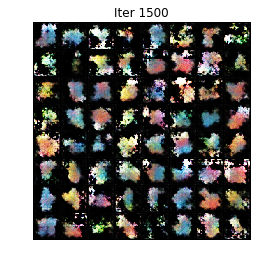

[115/1000][6/13]	Loss_D: -1.3166	Loss_G: 0.6610
[115/1000][7/13]	Loss_D: -1.3105	Loss_G: 0.6723
[115/1000][8/13]	Loss_D: -1.3250	Loss_G: 0.6733
[115/1000][9/13]	Loss_D: -1.2985	Loss_G: 0.6592
[115/1000][10/13]	Loss_D: -1.2837	Loss_G: 0.6658
[115/1000][11/13]	Loss_D: -1.3005	Loss_G: 0.6698
[115/1000][12/13]	Loss_D: -1.3082	Loss_G: 0.6597
[116/1000][0/13]	Loss_D: -1.0215	Loss_G: 0.7125
[116/1000][1/13]	Loss_D: -1.3239	Loss_G: 0.6776
[116/1000][2/13]	Loss_D: -1.3474	Loss_G: 0.6783
[116/1000][3/13]	Loss_D: -1.3528	Loss_G: 0.6839
[116/1000][4/13]	Loss_D: -1.3524	Loss_G: 0.6759
[116/1000][5/13]	Loss_D: -1.3573	Loss_G: 0.6834
[116/1000][6/13]	Loss_D: -1.3446	Loss_G: 0.6782
[116/1000][7/13]	Loss_D: -1.3399	Loss_G: 0.6737
[116/1000][8/13]	Loss_D: -1.3149	Loss_G: 0.6662
[116/1000][9/13]	Loss_D: -1.3435	Loss_G: 0.6850
[116/1000][10/13]	Loss_D: -1.3420	Loss_G: 0.6716
[116/1000][11/13]	Loss_D: -1.3393	Loss_G: 0.6809
[116/1000][12/13]	Loss_D: -1.3354	Loss_G: 0.6660
[117/1000][0/13]	Loss_D: -1.3178	L

[128/1000][7/13]	Loss_D: -1.3344	Loss_G: 0.6605
[128/1000][8/13]	Loss_D: -1.3206	Loss_G: 0.6668
[128/1000][9/13]	Loss_D: -1.3399	Loss_G: 0.6655
[128/1000][10/13]	Loss_D: -1.3213	Loss_G: 0.6778
[128/1000][11/13]	Loss_D: -1.3155	Loss_G: 0.6626
[128/1000][12/13]	Loss_D: -1.3196	Loss_G: 0.6731
[129/1000][0/13]	Loss_D: -1.3354	Loss_G: 0.6620
[129/1000][1/13]	Loss_D: -1.3119	Loss_G: 0.6659
[129/1000][2/13]	Loss_D: -1.2949	Loss_G: 0.6551
[129/1000][3/13]	Loss_D: -1.2729	Loss_G: 0.6715
[129/1000][4/13]	Loss_D: -1.2622	Loss_G: 0.5956
[129/1000][5/13]	Loss_D: -1.2651	Loss_G: 0.6837
[129/1000][6/13]	Loss_D: -1.2019	Loss_G: 0.6209
[129/1000][7/13]	Loss_D: -1.3304	Loss_G: 0.6760
[129/1000][8/13]	Loss_D: -1.3423	Loss_G: 0.6724
[129/1000][9/13]	Loss_D: -1.3481	Loss_G: 0.6711
[129/1000][10/13]	Loss_D: -1.3432	Loss_G: 0.6697
[129/1000][11/13]	Loss_D: -1.3300	Loss_G: 0.6793
[129/1000][12/13]	Loss_D: -1.3095	Loss_G: 0.6643
[130/1000][0/13]	Loss_D: -1.3238	Loss_G: 0.6751
[130/1000][1/13]	Loss_D: -1.3011	L

[141/1000][8/13]	Loss_D: -1.3193	Loss_G: 0.6574
[141/1000][9/13]	Loss_D: -1.1383	Loss_G: 0.6918
[141/1000][10/13]	Loss_D: -0.9203	Loss_G: 0.3061
[141/1000][11/13]	Loss_D: -0.7025	Loss_G: -0.1022
[141/1000][12/13]	Loss_D: -0.0542	Loss_G: -0.5938
[142/1000][0/13]	Loss_D: -0.4012	Loss_G: 0.4152
[142/1000][1/13]	Loss_D: -1.0651	Loss_G: 0.5193
[142/1000][2/13]	Loss_D: -1.2349	Loss_G: 0.6639
[142/1000][3/13]	Loss_D: -1.3154	Loss_G: 0.6615
[142/1000][4/13]	Loss_D: -1.3325	Loss_G: 0.6636
[142/1000][5/13]	Loss_D: -1.3390	Loss_G: 0.6750
[142/1000][6/13]	Loss_D: -1.3429	Loss_G: 0.6735
[142/1000][7/13]	Loss_D: -1.3460	Loss_G: 0.6807
[142/1000][8/13]	Loss_D: -1.3456	Loss_G: 0.6733
[142/1000][9/13]	Loss_D: -1.3486	Loss_G: 0.6784
[142/1000][10/13]	Loss_D: -1.3701	Loss_G: 0.6841
[142/1000][11/13]	Loss_D: -1.3813	Loss_G: 0.6932
[142/1000][12/13]	Loss_D: -1.3542	Loss_G: 0.6768
[143/1000][0/13]	Loss_D: -1.3623	Loss_G: 0.6854
[143/1000][1/13]	Loss_D: -1.3732	Loss_G: 0.6898
[143/1000][2/13]	Loss_D: -1.3776

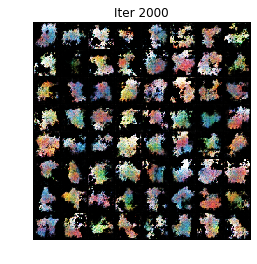

[153/1000][12/13]	Loss_D: -1.2305	Loss_G: 0.6678
[154/1000][0/13]	Loss_D: -1.2750	Loss_G: 0.6318
[154/1000][1/13]	Loss_D: -1.3058	Loss_G: 0.6528
[154/1000][2/13]	Loss_D: -1.3197	Loss_G: 0.6519
[154/1000][3/13]	Loss_D: -1.2732	Loss_G: 0.6501
[154/1000][4/13]	Loss_D: -1.2870	Loss_G: 0.6357
[154/1000][5/13]	Loss_D: -1.2593	Loss_G: 0.6440
[154/1000][6/13]	Loss_D: -1.2818	Loss_G: 0.6275
[154/1000][7/13]	Loss_D: -1.2385	Loss_G: 0.6861
[154/1000][8/13]	Loss_D: -1.3000	Loss_G: 0.6310
[154/1000][9/13]	Loss_D: -1.2218	Loss_G: 0.6861
[154/1000][10/13]	Loss_D: -1.3136	Loss_G: 0.6514
[154/1000][11/13]	Loss_D: -1.2959	Loss_G: 0.6463
[154/1000][12/13]	Loss_D: -1.2890	Loss_G: 0.6559
[155/1000][0/13]	Loss_D: -1.2855	Loss_G: 0.6691
[155/1000][1/13]	Loss_D: -1.2291	Loss_G: 0.5785
[155/1000][2/13]	Loss_D: -1.0018	Loss_G: 0.6964
[155/1000][3/13]	Loss_D: -1.3344	Loss_G: 0.6668
[155/1000][4/13]	Loss_D: -1.3523	Loss_G: 0.6663
[155/1000][5/13]	Loss_D: -1.3178	Loss_G: 0.6600
[155/1000][6/13]	Loss_D: -1.3340	Los

[167/1000][0/13]	Loss_D: -0.9337	Loss_G: 0.6884
[167/1000][1/13]	Loss_D: -1.0189	Loss_G: 0.4580
[167/1000][2/13]	Loss_D: -1.1289	Loss_G: 0.6759
[167/1000][3/13]	Loss_D: -1.2945	Loss_G: 0.6423
[167/1000][4/13]	Loss_D: -1.2760	Loss_G: 0.6364
[167/1000][5/13]	Loss_D: -1.2730	Loss_G: 0.6420
[167/1000][6/13]	Loss_D: -1.2372	Loss_G: 0.6236
[167/1000][7/13]	Loss_D: -1.2342	Loss_G: 0.6179
[167/1000][8/13]	Loss_D: -1.1782	Loss_G: 0.6495
[167/1000][9/13]	Loss_D: -1.1398	Loss_G: 0.5000
[167/1000][10/13]	Loss_D: -1.0202	Loss_G: 0.3318
[167/1000][11/13]	Loss_D: -0.6561	Loss_G: 0.6727
[167/1000][12/13]	Loss_D: -1.1987	Loss_G: 0.6509
[168/1000][0/13]	Loss_D: -1.2384	Loss_G: 0.6019
[168/1000][1/13]	Loss_D: -1.2503	Loss_G: 0.6223
[168/1000][2/13]	Loss_D: -1.2159	Loss_G: 0.6372
[168/1000][3/13]	Loss_D: -1.2352	Loss_G: 0.6196
[168/1000][4/13]	Loss_D: -1.2668	Loss_G: 0.6403
[168/1000][5/13]	Loss_D: -1.2607	Loss_G: 0.6438
[168/1000][6/13]	Loss_D: -1.2892	Loss_G: 0.6466
[168/1000][7/13]	Loss_D: -1.2630	Loss

[180/1000][1/13]	Loss_D: -1.3069	Loss_G: 0.6507
[180/1000][2/13]	Loss_D: -1.2805	Loss_G: 0.6364
[180/1000][3/13]	Loss_D: -1.2437	Loss_G: 0.6405
[180/1000][4/13]	Loss_D: -1.2522	Loss_G: 0.6296
[180/1000][5/13]	Loss_D: -1.2694	Loss_G: 0.6349
[180/1000][6/13]	Loss_D: -1.2785	Loss_G: 0.6386
[180/1000][7/13]	Loss_D: -1.2618	Loss_G: 0.6342
[180/1000][8/13]	Loss_D: -1.2727	Loss_G: 0.6469
[180/1000][9/13]	Loss_D: -1.2324	Loss_G: 0.5964
[180/1000][10/13]	Loss_D: -1.0714	Loss_G: 0.6500
[180/1000][11/13]	Loss_D: -0.8708	Loss_G: -0.2422
[180/1000][12/13]	Loss_D: -0.6058	Loss_G: -0.1099
[181/1000][0/13]	Loss_D: -0.3769	Loss_G: 0.5750
[181/1000][1/13]	Loss_D: -0.8358	Loss_G: 0.3573
[181/1000][2/13]	Loss_D: -1.0143	Loss_G: 0.6628
[181/1000][3/13]	Loss_D: -1.2913	Loss_G: 0.6464
[181/1000][4/13]	Loss_D: -1.3035	Loss_G: 0.6467
[181/1000][5/13]	Loss_D: -1.3303	Loss_G: 0.6534
[181/1000][6/13]	Loss_D: -1.3193	Loss_G: 0.6574
[181/1000][7/13]	Loss_D: -1.3163	Loss_G: 0.6528
[181/1000][8/13]	Loss_D: -1.3278	Lo

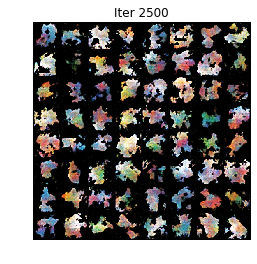

[192/1000][5/13]	Loss_D: -1.1947	Loss_G: 0.5827
[192/1000][6/13]	Loss_D: -1.2017	Loss_G: 0.5918
[192/1000][7/13]	Loss_D: -1.2220	Loss_G: 0.6179
[192/1000][8/13]	Loss_D: -1.1804	Loss_G: 0.5744
[192/1000][9/13]	Loss_D: -1.1084	Loss_G: 0.6674
[192/1000][10/13]	Loss_D: -0.6246	Loss_G: 0.3770
[192/1000][11/13]	Loss_D: -0.8103	Loss_G: 0.6796
[192/1000][12/13]	Loss_D: -0.9547	Loss_G: 0.3219
[193/1000][0/13]	Loss_D: -0.8587	Loss_G: 0.6718
[193/1000][1/13]	Loss_D: -0.8845	Loss_G: 0.4414
[193/1000][2/13]	Loss_D: -1.0216	Loss_G: 0.6559
[193/1000][3/13]	Loss_D: -1.2066	Loss_G: 0.5922
[193/1000][4/13]	Loss_D: -1.2072	Loss_G: 0.6192
[193/1000][5/13]	Loss_D: -1.2163	Loss_G: 0.5901
[193/1000][6/13]	Loss_D: -1.1789	Loss_G: 0.6205
[193/1000][7/13]	Loss_D: -1.1349	Loss_G: 0.5100
[193/1000][8/13]	Loss_D: -1.0344	Loss_G: 0.6629
[193/1000][9/13]	Loss_D: -1.1507	Loss_G: 0.5587
[193/1000][10/13]	Loss_D: -1.1267	Loss_G: 0.6348
[193/1000][11/13]	Loss_D: -1.1744	Loss_G: 0.5483
[193/1000][12/13]	Loss_D: -1.1238	L

[205/1000][6/13]	Loss_D: -0.9591	Loss_G: 0.6646
[205/1000][7/13]	Loss_D: -0.8867	Loss_G: 0.2477
[205/1000][8/13]	Loss_D: -1.0857	Loss_G: 0.6341
[205/1000][9/13]	Loss_D: -1.2072	Loss_G: 0.6044
[205/1000][10/13]	Loss_D: -1.2013	Loss_G: 0.6010
[205/1000][11/13]	Loss_D: -1.1835	Loss_G: 0.5824
[205/1000][12/13]	Loss_D: -1.1368	Loss_G: 0.5951
[206/1000][0/13]	Loss_D: -1.1457	Loss_G: 0.5553
[206/1000][1/13]	Loss_D: -1.1394	Loss_G: 0.5840
[206/1000][2/13]	Loss_D: -1.1377	Loss_G: 0.4760
[206/1000][3/13]	Loss_D: -0.8411	Loss_G: 0.6648
[206/1000][4/13]	Loss_D: -0.8798	Loss_G: 0.1942
[206/1000][5/13]	Loss_D: -0.6213	Loss_G: 0.6587
[206/1000][6/13]	Loss_D: -1.0558	Loss_G: 0.4519
[206/1000][7/13]	Loss_D: -0.9495	Loss_G: 0.6678
[206/1000][8/13]	Loss_D: -1.1266	Loss_G: 0.5364
[206/1000][9/13]	Loss_D: -1.2036	Loss_G: 0.6098
[206/1000][10/13]	Loss_D: -1.1649	Loss_G: 0.5666
[206/1000][11/13]	Loss_D: -1.1546	Loss_G: 0.5913
[206/1000][12/13]	Loss_D: -1.1491	Loss_G: 0.5742
[207/1000][0/13]	Loss_D: -1.1467	L

[218/1000][7/13]	Loss_D: -0.8931	Loss_G: 0.6723
[218/1000][8/13]	Loss_D: -0.5714	Loss_G: 0.4887
[218/1000][9/13]	Loss_D: -1.0807	Loss_G: 0.6324
[218/1000][10/13]	Loss_D: -1.1143	Loss_G: 0.4793
[218/1000][11/13]	Loss_D: -0.8638	Loss_G: 0.6725
[218/1000][12/13]	Loss_D: -1.2198	Loss_G: 0.5942
[219/1000][0/13]	Loss_D: -1.2299	Loss_G: 0.6033
[219/1000][1/13]	Loss_D: -1.2022	Loss_G: 0.5919
[219/1000][2/13]	Loss_D: -1.1475	Loss_G: 0.5367
[219/1000][3/13]	Loss_D: -1.0667	Loss_G: 0.6248
[219/1000][4/13]	Loss_D: -0.6772	Loss_G: -0.0330
[219/1000][5/13]	Loss_D: -0.9379	Loss_G: 0.6630
[219/1000][6/13]	Loss_D: -1.0095	Loss_G: 0.4734
[219/1000][7/13]	Loss_D: -0.5714	Loss_G: 0.6632
[219/1000][8/13]	Loss_D: -1.1714	Loss_G: 0.5928
[219/1000][9/13]	Loss_D: -1.2294	Loss_G: 0.6047
[219/1000][10/13]	Loss_D: -1.2091	Loss_G: 0.6164
[219/1000][11/13]	Loss_D: -1.1887	Loss_G: 0.5825
[219/1000][12/13]	Loss_D: -1.1262	Loss_G: 0.6053
[220/1000][0/13]	Loss_D: -1.1402	Loss_G: 0.5439
[220/1000][1/13]	Loss_D: -1.0240	

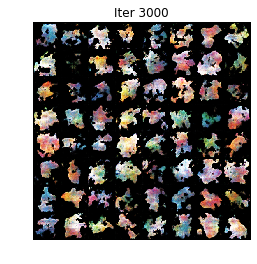

[230/1000][11/13]	Loss_D: -1.1930	Loss_G: 0.6005
[230/1000][12/13]	Loss_D: -1.1805	Loss_G: 0.5928
[231/1000][0/13]	Loss_D: -1.1788	Loss_G: 0.5973
[231/1000][1/13]	Loss_D: -1.1509	Loss_G: 0.5655
[231/1000][2/13]	Loss_D: -1.1629	Loss_G: 0.6078
[231/1000][3/13]	Loss_D: -1.1751	Loss_G: 0.5900
[231/1000][4/13]	Loss_D: -0.9975	Loss_G: 0.3659
[231/1000][5/13]	Loss_D: -0.8420	Loss_G: 0.6675
[231/1000][6/13]	Loss_D: -0.8957	Loss_G: -0.0040
[231/1000][7/13]	Loss_D: -0.9512	Loss_G: 0.6637
[231/1000][8/13]	Loss_D: -0.8777	Loss_G: 0.2057
[231/1000][9/13]	Loss_D: -1.0711	Loss_G: 0.6533
[231/1000][10/13]	Loss_D: -1.2428	Loss_G: 0.6301
[231/1000][11/13]	Loss_D: -1.2274	Loss_G: 0.5968
[231/1000][12/13]	Loss_D: -1.2160	Loss_G: 0.6067
[232/1000][0/13]	Loss_D: -1.1706	Loss_G: 0.5660
[232/1000][1/13]	Loss_D: -1.1265	Loss_G: 0.5536
[232/1000][2/13]	Loss_D: -1.0962	Loss_G: 0.4816
[232/1000][3/13]	Loss_D: -1.0038	Loss_G: 0.6724
[232/1000][4/13]	Loss_D: -0.7855	Loss_G: -0.1956
[232/1000][5/13]	Loss_D: -0.6836	

[243/1000][12/13]	Loss_D: -0.7485	Loss_G: 0.6736
[244/1000][0/13]	Loss_D: -0.6187	Loss_G: 0.4524
[244/1000][1/13]	Loss_D: -1.0501	Loss_G: 0.6371
[244/1000][2/13]	Loss_D: -1.2007	Loss_G: 0.5604
[244/1000][3/13]	Loss_D: -1.1464	Loss_G: 0.5754
[244/1000][4/13]	Loss_D: -1.1489	Loss_G: 0.5765
[244/1000][5/13]	Loss_D: -1.1978	Loss_G: 0.6047
[244/1000][6/13]	Loss_D: -1.1843	Loss_G: 0.5858
[244/1000][7/13]	Loss_D: -1.1972	Loss_G: 0.5839
[244/1000][8/13]	Loss_D: -1.0968	Loss_G: 0.4676
[244/1000][9/13]	Loss_D: -0.9543	Loss_G: 0.6717
[244/1000][10/13]	Loss_D: -0.9166	Loss_G: -0.4506
[244/1000][11/13]	Loss_D: -0.7411	Loss_G: 0.2968
[244/1000][12/13]	Loss_D: -0.7982	Loss_G: 0.6655
[245/1000][0/13]	Loss_D: -1.0687	Loss_G: 0.5021
[245/1000][1/13]	Loss_D: -1.0056	Loss_G: 0.6541
[245/1000][2/13]	Loss_D: -1.2287	Loss_G: 0.5858
[245/1000][3/13]	Loss_D: -1.1537	Loss_G: 0.5344
[245/1000][4/13]	Loss_D: -1.0925	Loss_G: 0.6183
[245/1000][5/13]	Loss_D: -1.1760	Loss_G: 0.5601
[245/1000][6/13]	Loss_D: -1.0881	Lo

[257/1000][0/13]	Loss_D: -1.1432	Loss_G: 0.5545
[257/1000][1/13]	Loss_D: -1.1674	Loss_G: 0.5856
[257/1000][2/13]	Loss_D: -1.1462	Loss_G: 0.5338
[257/1000][3/13]	Loss_D: -1.1107	Loss_G: 0.6362
[257/1000][4/13]	Loss_D: -1.1223	Loss_G: 0.5200
[257/1000][5/13]	Loss_D: -1.2120	Loss_G: 0.5916
[257/1000][6/13]	Loss_D: -1.1189	Loss_G: 0.5339
[257/1000][7/13]	Loss_D: -1.1222	Loss_G: 0.6169
[257/1000][8/13]	Loss_D: -1.2048	Loss_G: 0.5915
[257/1000][9/13]	Loss_D: -1.1709	Loss_G: 0.5718
[257/1000][10/13]	Loss_D: -1.1391	Loss_G: 0.6098
[257/1000][11/13]	Loss_D: -0.9227	Loss_G: 0.1088
[257/1000][12/13]	Loss_D: -0.2469	Loss_G: 0.5854
[258/1000][0/13]	Loss_D: -1.1700	Loss_G: 0.5878
[258/1000][1/13]	Loss_D: -1.1862	Loss_G: 0.5792
[258/1000][2/13]	Loss_D: -1.1798	Loss_G: 0.6299
[258/1000][3/13]	Loss_D: -1.0543	Loss_G: 0.3812
[258/1000][4/13]	Loss_D: -0.4438	Loss_G: 0.5843
[258/1000][5/13]	Loss_D: -0.5132	Loss_G: 0.0700
[258/1000][6/13]	Loss_D: -0.6982	Loss_G: 0.6599
[258/1000][7/13]	Loss_D: -1.1262	Loss

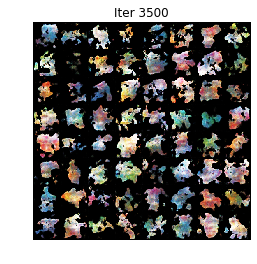

[269/1000][4/13]	Loss_D: -1.0337	Loss_G: 0.3302
[269/1000][5/13]	Loss_D: -0.7498	Loss_G: 0.6405
[269/1000][6/13]	Loss_D: -0.5056	Loss_G: 0.6601
[269/1000][7/13]	Loss_D: -1.1182	Loss_G: 0.5126
[269/1000][8/13]	Loss_D: -1.0837	Loss_G: 0.6517
[269/1000][9/13]	Loss_D: -1.2009	Loss_G: 0.5727
[269/1000][10/13]	Loss_D: -1.1652	Loss_G: 0.5910
[269/1000][11/13]	Loss_D: -1.1322	Loss_G: 0.5694
[269/1000][12/13]	Loss_D: -1.1399	Loss_G: 0.5938
[270/1000][0/13]	Loss_D: -1.1916	Loss_G: 0.6058
[270/1000][1/13]	Loss_D: -1.0188	Loss_G: 0.2804
[270/1000][2/13]	Loss_D: -0.5730	Loss_G: 0.6520
[270/1000][3/13]	Loss_D: -0.8742	Loss_G: 0.6685
[270/1000][4/13]	Loss_D: -0.9108	Loss_G: -0.3012
[270/1000][5/13]	Loss_D: -0.8163	Loss_G: -0.0242
[270/1000][6/13]	Loss_D: -0.6536	Loss_G: 0.6619
[270/1000][7/13]	Loss_D: -1.2651	Loss_G: 0.6330
[270/1000][8/13]	Loss_D: -1.2447	Loss_G: 0.6092
[270/1000][9/13]	Loss_D: -1.2100	Loss_G: 0.6176
[270/1000][10/13]	Loss_D: -1.2061	Loss_G: 0.5990
[270/1000][11/13]	Loss_D: -1.2065	

[282/1000][5/13]	Loss_D: -1.1965	Loss_G: 0.5748
[282/1000][6/13]	Loss_D: -1.2319	Loss_G: 0.6154
[282/1000][7/13]	Loss_D: -1.1461	Loss_G: 0.5542
[282/1000][8/13]	Loss_D: -1.1736	Loss_G: 0.6170
[282/1000][9/13]	Loss_D: -0.7787	Loss_G: -0.2972
[282/1000][10/13]	Loss_D: -1.2077	Loss_G: 0.6387
[282/1000][11/13]	Loss_D: -1.0590	Loss_G: 0.3698
[282/1000][12/13]	Loss_D: -0.3918	Loss_G: 0.6431
[283/1000][0/13]	Loss_D: -1.1316	Loss_G: 0.6056
[283/1000][1/13]	Loss_D: -1.2191	Loss_G: 0.5916
[283/1000][2/13]	Loss_D: -1.1846	Loss_G: 0.5650
[283/1000][3/13]	Loss_D: -1.1950	Loss_G: 0.6021
[283/1000][4/13]	Loss_D: -1.0793	Loss_G: 0.4045
[283/1000][5/13]	Loss_D: -0.7063	Loss_G: 0.6679
[283/1000][6/13]	Loss_D: -1.0124	Loss_G: 0.6642
[283/1000][7/13]	Loss_D: -1.1577	Loss_G: 0.5101
[283/1000][8/13]	Loss_D: -1.0264	Loss_G: 0.6471
[283/1000][9/13]	Loss_D: -1.1695	Loss_G: 0.5538
[283/1000][10/13]	Loss_D: -1.2353	Loss_G: 0.6094
[283/1000][11/13]	Loss_D: -1.1015	Loss_G: 0.4636
[283/1000][12/13]	Loss_D: -0.8678	

[295/1000][6/13]	Loss_D: -0.8070	Loss_G: 0.6496
[295/1000][7/13]	Loss_D: -1.0353	Loss_G: 0.4659
[295/1000][8/13]	Loss_D: -0.9689	Loss_G: 0.6568
[295/1000][9/13]	Loss_D: -0.9854	Loss_G: 0.3253
[295/1000][10/13]	Loss_D: -0.9436	Loss_G: 0.6658
[295/1000][11/13]	Loss_D: -1.1419	Loss_G: 0.5525
[295/1000][12/13]	Loss_D: -1.2109	Loss_G: 0.6061
[296/1000][0/13]	Loss_D: -1.2090	Loss_G: 0.5871
[296/1000][1/13]	Loss_D: -1.1909	Loss_G: 0.5940
[296/1000][2/13]	Loss_D: -1.1712	Loss_G: 0.6004
[296/1000][3/13]	Loss_D: -1.2113	Loss_G: 0.5830
[296/1000][4/13]	Loss_D: -1.1383	Loss_G: 0.5985
[296/1000][5/13]	Loss_D: -1.1388	Loss_G: 0.5266
[296/1000][6/13]	Loss_D: -1.0653	Loss_G: 0.6466
[296/1000][7/13]	Loss_D: -0.7803	Loss_G: 0.3141
[296/1000][8/13]	Loss_D: -0.9433	Loss_G: 0.6645
[296/1000][9/13]	Loss_D: -0.9245	Loss_G: 0.3779
[296/1000][10/13]	Loss_D: -1.0724	Loss_G: 0.6580
[296/1000][11/13]	Loss_D: -1.1490	Loss_G: 0.5329
[296/1000][12/13]	Loss_D: -1.1507	Loss_G: 0.5910
[297/1000][0/13]	Loss_D: -1.1525	L

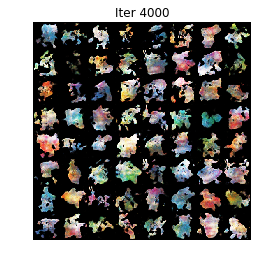

[307/1000][10/13]	Loss_D: -1.1600	Loss_G: 0.6263
[307/1000][11/13]	Loss_D: -1.1667	Loss_G: 0.5713
[307/1000][12/13]	Loss_D: -1.2185	Loss_G: 0.6159
[308/1000][0/13]	Loss_D: -1.1851	Loss_G: 0.5639
[308/1000][1/13]	Loss_D: -1.1950	Loss_G: 0.6099
[308/1000][2/13]	Loss_D: -1.0730	Loss_G: 0.4122
[308/1000][3/13]	Loss_D: -0.6616	Loss_G: 0.6566
[308/1000][4/13]	Loss_D: -0.9375	Loss_G: 0.1834
[308/1000][5/13]	Loss_D: -0.8361	Loss_G: 0.3033
[308/1000][6/13]	Loss_D: -0.7186	Loss_G: 0.6490
[308/1000][7/13]	Loss_D: -1.1171	Loss_G: 0.5614
[308/1000][8/13]	Loss_D: -1.1707	Loss_G: 0.5925
[308/1000][9/13]	Loss_D: -1.1646	Loss_G: 0.5593
[308/1000][10/13]	Loss_D: -1.1847	Loss_G: 0.6043
[308/1000][11/13]	Loss_D: -1.1630	Loss_G: 0.5665
[308/1000][12/13]	Loss_D: -0.9946	Loss_G: 0.3239
[309/1000][0/13]	Loss_D: -0.7599	Loss_G: 0.6539
[309/1000][1/13]	Loss_D: -0.9153	Loss_G: 0.0004
[309/1000][2/13]	Loss_D: -1.0250	Loss_G: 0.6577
[309/1000][3/13]	Loss_D: -1.1677	Loss_G: 0.5538
[309/1000][4/13]	Loss_D: -1.2034	L

[320/1000][11/13]	Loss_D: -1.1624	Loss_G: 0.5923
[320/1000][12/13]	Loss_D: -1.1633	Loss_G: 0.5254
[321/1000][0/13]	Loss_D: -1.1013	Loss_G: 0.6243
[321/1000][1/13]	Loss_D: -0.7800	Loss_G: -0.0093
[321/1000][2/13]	Loss_D: -0.7654	Loss_G: 0.6512
[321/1000][3/13]	Loss_D: -0.8700	Loss_G: 0.2825
[321/1000][4/13]	Loss_D: -1.1150	Loss_G: 0.6396
[321/1000][5/13]	Loss_D: -1.2097	Loss_G: 0.5880
[321/1000][6/13]	Loss_D: -1.1849	Loss_G: 0.5777
[321/1000][7/13]	Loss_D: -1.1110	Loss_G: 0.4580
[321/1000][8/13]	Loss_D: -1.0362	Loss_G: 0.6614
[321/1000][9/13]	Loss_D: -0.9243	Loss_G: 0.3109
[321/1000][10/13]	Loss_D: -1.0916	Loss_G: 0.6609
[321/1000][11/13]	Loss_D: -1.1409	Loss_G: 0.5206
[321/1000][12/13]	Loss_D: -0.9748	Loss_G: 0.6578
[322/1000][0/13]	Loss_D: -0.8798	Loss_G: 0.1535
[322/1000][1/13]	Loss_D: -1.0314	Loss_G: 0.6572
[322/1000][2/13]	Loss_D: -1.2432	Loss_G: 0.6174
[322/1000][3/13]	Loss_D: -1.1702	Loss_G: 0.5444
[322/1000][4/13]	Loss_D: -1.1490	Loss_G: 0.5896
[322/1000][5/13]	Loss_D: -1.1406	L

[333/1000][12/13]	Loss_D: -1.1767	Loss_G: 0.6343
[334/1000][0/13]	Loss_D: -0.9398	Loss_G: 0.0812
[334/1000][1/13]	Loss_D: -0.8699	Loss_G: 0.6571
[334/1000][2/13]	Loss_D: -0.9893	Loss_G: -0.0859
[334/1000][3/13]	Loss_D: -0.8860	Loss_G: 0.6597
[334/1000][4/13]	Loss_D: -0.8886	Loss_G: 0.2775
[334/1000][5/13]	Loss_D: -1.1920	Loss_G: 0.6305
[334/1000][6/13]	Loss_D: -1.2113	Loss_G: 0.5872
[334/1000][7/13]	Loss_D: -1.2144	Loss_G: 0.6239
[334/1000][8/13]	Loss_D: -1.1342	Loss_G: 0.4588
[334/1000][9/13]	Loss_D: -0.7699	Loss_G: 0.6467
[334/1000][10/13]	Loss_D: -0.7804	Loss_G: -0.1308
[334/1000][11/13]	Loss_D: -1.0152	Loss_G: 0.6605
[334/1000][12/13]	Loss_D: -1.2191	Loss_G: 0.6021
[335/1000][0/13]	Loss_D: -1.2189	Loss_G: 0.5972
[335/1000][1/13]	Loss_D: -1.1726	Loss_G: 0.6072
[335/1000][2/13]	Loss_D: -1.2187	Loss_G: 0.6001
[335/1000][3/13]	Loss_D: -1.0762	Loss_G: 0.4327
[335/1000][4/13]	Loss_D: -0.8017	Loss_G: 0.6504
[335/1000][5/13]	Loss_D: -0.9532	Loss_G: 0.0820
[335/1000][6/13]	Loss_D: -1.0560	L

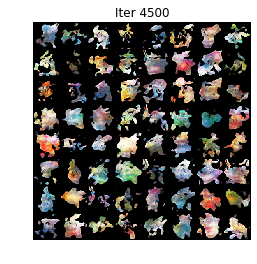

[346/1000][3/13]	Loss_D: -1.1667	Loss_G: 0.5748
[346/1000][4/13]	Loss_D: -1.0787	Loss_G: 0.4467
[346/1000][5/13]	Loss_D: -0.5806	Loss_G: 0.6322
[346/1000][6/13]	Loss_D: -0.9753	Loss_G: 0.6619
[346/1000][7/13]	Loss_D: -0.9778	Loss_G: 0.3139
[346/1000][8/13]	Loss_D: -0.6831	Loss_G: 0.6717
[346/1000][9/13]	Loss_D: -1.1706	Loss_G: 0.5724
[346/1000][10/13]	Loss_D: -1.1260	Loss_G: 0.6321
[346/1000][11/13]	Loss_D: -1.0618	Loss_G: 0.4095
[346/1000][12/13]	Loss_D: -0.9892	Loss_G: 0.6517
[347/1000][0/13]	Loss_D: -1.1142	Loss_G: 0.5048
[347/1000][1/13]	Loss_D: -1.1268	Loss_G: 0.6263
[347/1000][2/13]	Loss_D: -1.1501	Loss_G: 0.5191
[347/1000][3/13]	Loss_D: -1.1703	Loss_G: 0.6095
[347/1000][4/13]	Loss_D: -1.0974	Loss_G: 0.4264
[347/1000][5/13]	Loss_D: -1.1258	Loss_G: 0.6463
[347/1000][6/13]	Loss_D: -0.9005	Loss_G: -0.2360
[347/1000][7/13]	Loss_D: -1.1767	Loss_G: 0.6098
[347/1000][8/13]	Loss_D: -0.7746	Loss_G: 0.0618
[347/1000][9/13]	Loss_D: -1.0699	Loss_G: 0.6341
[347/1000][10/13]	Loss_D: -1.1588	Lo

[359/1000][4/13]	Loss_D: -1.0649	Loss_G: 0.3923
[359/1000][5/13]	Loss_D: -0.9424	Loss_G: 0.6485
[359/1000][6/13]	Loss_D: -1.1395	Loss_G: 0.5170
[359/1000][7/13]	Loss_D: -1.1572	Loss_G: 0.6219
[359/1000][8/13]	Loss_D: -1.1523	Loss_G: 0.5091
[359/1000][9/13]	Loss_D: -1.1070	Loss_G: 0.6132
[359/1000][10/13]	Loss_D: -1.1025	Loss_G: 0.4385
[359/1000][11/13]	Loss_D: -0.3656	Loss_G: 0.6397
[359/1000][12/13]	Loss_D: -0.8401	Loss_G: 0.6583
[360/1000][0/13]	Loss_D: -0.8195	Loss_G: 0.1656
[360/1000][1/13]	Loss_D: -1.1306	Loss_G: 0.6271
[360/1000][2/13]	Loss_D: -1.1299	Loss_G: 0.5097
[360/1000][3/13]	Loss_D: -1.0999	Loss_G: 0.6418
[360/1000][4/13]	Loss_D: -1.1381	Loss_G: 0.5007
[360/1000][5/13]	Loss_D: -1.1704	Loss_G: 0.6204
[360/1000][6/13]	Loss_D: -1.1644	Loss_G: 0.5285
[360/1000][7/13]	Loss_D: -1.0469	Loss_G: 0.6319
[360/1000][8/13]	Loss_D: -0.8518	Loss_G: 0.2000
[360/1000][9/13]	Loss_D: -0.1775	Loss_G: -0.1163
[360/1000][10/13]	Loss_D: -0.8456	Loss_G: 0.6025
[360/1000][11/13]	Loss_D: -1.1003	L

[372/1000][5/13]	Loss_D: -0.8158	Loss_G: 0.6326
[372/1000][6/13]	Loss_D: -0.9208	Loss_G: 0.3797
[372/1000][7/13]	Loss_D: -1.0554	Loss_G: 0.6281
[372/1000][8/13]	Loss_D: -1.1483	Loss_G: 0.5508
[372/1000][9/13]	Loss_D: -1.1722	Loss_G: 0.6107
[372/1000][10/13]	Loss_D: -1.2007	Loss_G: 0.5692
[372/1000][11/13]	Loss_D: -1.1218	Loss_G: 0.5294
[372/1000][12/13]	Loss_D: -1.1318	Loss_G: 0.5860
[373/1000][0/13]	Loss_D: -1.1165	Loss_G: 0.4779
[373/1000][1/13]	Loss_D: -0.9161	Loss_G: 0.6644
[373/1000][2/13]	Loss_D: -0.8567	Loss_G: -0.3908
[373/1000][3/13]	Loss_D: -0.9651	Loss_G: 0.3802
[373/1000][4/13]	Loss_D: -1.0311	Loss_G: 0.6478
[373/1000][5/13]	Loss_D: -1.1133	Loss_G: 0.5132
[373/1000][6/13]	Loss_D: -0.9873	Loss_G: 0.6377
[373/1000][7/13]	Loss_D: -1.1721	Loss_G: 0.5573
[373/1000][8/13]	Loss_D: -1.1080	Loss_G: 0.5725
[373/1000][9/13]	Loss_D: -1.1399	Loss_G: 0.5437
[373/1000][10/13]	Loss_D: -1.1169	Loss_G: 0.6317
[373/1000][11/13]	Loss_D: -1.0582	Loss_G: 0.3644
[373/1000][12/13]	Loss_D: -0.7390	

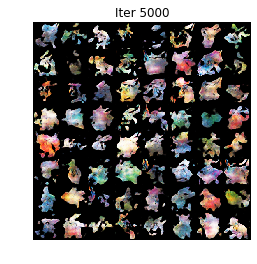

[384/1000][9/13]	Loss_D: -1.1297	Loss_G: 0.5354
[384/1000][10/13]	Loss_D: -1.0916	Loss_G: 0.6178
[384/1000][11/13]	Loss_D: -0.9838	Loss_G: 0.3360
[384/1000][12/13]	Loss_D: -1.0726	Loss_G: 0.6514
[385/1000][0/13]	Loss_D: -1.1328	Loss_G: 0.5217
[385/1000][1/13]	Loss_D: -1.1613	Loss_G: 0.6189
[385/1000][2/13]	Loss_D: -1.1771	Loss_G: 0.5767
[385/1000][3/13]	Loss_D: -1.1278	Loss_G: 0.5461
[385/1000][4/13]	Loss_D: -1.1107	Loss_G: 0.6380
[385/1000][5/13]	Loss_D: -0.9266	Loss_G: -0.1713
[385/1000][6/13]	Loss_D: -0.6397	Loss_G: 0.6613
[385/1000][7/13]	Loss_D: -1.1083	Loss_G: 0.5387
[385/1000][8/13]	Loss_D: -1.1464	Loss_G: 0.6202
[385/1000][9/13]	Loss_D: -1.1048	Loss_G: 0.4831
[385/1000][10/13]	Loss_D: -1.1408	Loss_G: 0.6292
[385/1000][11/13]	Loss_D: -0.9220	Loss_G: 0.2490
[385/1000][12/13]	Loss_D: -0.8970	Loss_G: 0.6220
[386/1000][0/13]	Loss_D: -1.1198	Loss_G: 0.5152
[386/1000][1/13]	Loss_D: -1.0269	Loss_G: 0.6291
[386/1000][2/13]	Loss_D: -1.0067	Loss_G: 0.3393
[386/1000][3/13]	Loss_D: -1.0144	

[397/1000][10/13]	Loss_D: -0.1927	Loss_G: 0.1603
[397/1000][11/13]	Loss_D: -1.0735	Loss_G: 0.6246
[397/1000][12/13]	Loss_D: -0.9556	Loss_G: -0.1236
[398/1000][0/13]	Loss_D: -0.8599	Loss_G: 0.6426
[398/1000][1/13]	Loss_D: -1.1599	Loss_G: 0.5519
[398/1000][2/13]	Loss_D: -1.1824	Loss_G: 0.6100
[398/1000][3/13]	Loss_D: -1.1270	Loss_G: 0.4662
[398/1000][4/13]	Loss_D: -1.0437	Loss_G: 0.6482
[398/1000][5/13]	Loss_D: -1.0503	Loss_G: 0.4054
[398/1000][6/13]	Loss_D: -0.5815	Loss_G: 0.6394
[398/1000][7/13]	Loss_D: -1.0639	Loss_G: 0.6267
[398/1000][8/13]	Loss_D: -1.1541	Loss_G: 0.5321
[398/1000][9/13]	Loss_D: -1.1181	Loss_G: 0.6034
[398/1000][10/13]	Loss_D: -1.0397	Loss_G: 0.4101
[398/1000][11/13]	Loss_D: -0.7541	Loss_G: 0.6500
[398/1000][12/13]	Loss_D: -1.0200	Loss_G: 0.3288
[399/1000][0/13]	Loss_D: -0.7750	Loss_G: 0.6353
[399/1000][1/13]	Loss_D: -1.0853	Loss_G: 0.5102
[399/1000][2/13]	Loss_D: -1.1251	Loss_G: 0.5825
[399/1000][3/13]	Loss_D: -1.1530	Loss_G: 0.5551
[399/1000][4/13]	Loss_D: -1.1525	

[410/1000][11/13]	Loss_D: -1.1028	Loss_G: 0.5138
[410/1000][12/13]	Loss_D: -1.1780	Loss_G: 0.5908
[411/1000][0/13]	Loss_D: -1.1494	Loss_G: 0.5312
[411/1000][1/13]	Loss_D: -1.0772	Loss_G: 0.5909
[411/1000][2/13]	Loss_D: -0.9903	Loss_G: 0.3465
[411/1000][3/13]	Loss_D: -0.8186	Loss_G: 0.6139
[411/1000][4/13]	Loss_D: -0.9038	Loss_G: 0.3272
[411/1000][5/13]	Loss_D: -0.9295	Loss_G: 0.6319
[411/1000][6/13]	Loss_D: -0.9569	Loss_G: 0.2077
[411/1000][7/13]	Loss_D: -0.9955	Loss_G: 0.6320
[411/1000][8/13]	Loss_D: -1.1391	Loss_G: 0.5102
[411/1000][9/13]	Loss_D: -1.1660	Loss_G: 0.6078
[411/1000][10/13]	Loss_D: -1.1088	Loss_G: 0.4770
[411/1000][11/13]	Loss_D: -1.0862	Loss_G: 0.5984
[411/1000][12/13]	Loss_D: -1.0314	Loss_G: 0.4018
[412/1000][0/13]	Loss_D: -0.9129	Loss_G: 0.6586
[412/1000][1/13]	Loss_D: -0.7798	Loss_G: 0.2574
[412/1000][2/13]	Loss_D: -0.9834	Loss_G: 0.6301
[412/1000][3/13]	Loss_D: -1.1592	Loss_G: 0.5525
[412/1000][4/13]	Loss_D: -1.1269	Loss_G: 0.5710
[412/1000][5/13]	Loss_D: -1.0763	Lo

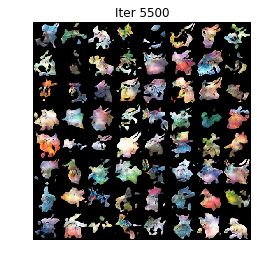

[423/1000][2/13]	Loss_D: -1.0067	Loss_G: 0.3640
[423/1000][3/13]	Loss_D: -0.9546	Loss_G: 0.6265
[423/1000][4/13]	Loss_D: -0.9522	Loss_G: 0.2359
[423/1000][5/13]	Loss_D: -0.7654	Loss_G: 0.6421
[423/1000][6/13]	Loss_D: -0.8663	Loss_G: 0.3249
[423/1000][7/13]	Loss_D: -1.0705	Loss_G: 0.6028
[423/1000][8/13]	Loss_D: -1.1319	Loss_G: 0.5439
[423/1000][9/13]	Loss_D: -1.0999	Loss_G: 0.6025
[423/1000][10/13]	Loss_D: -1.1809	Loss_G: 0.5769
[423/1000][11/13]	Loss_D: -1.1381	Loss_G: 0.5383
[423/1000][12/13]	Loss_D: -1.0685	Loss_G: 0.6065
[424/1000][0/13]	Loss_D: -1.0659	Loss_G: 0.4354
[424/1000][1/13]	Loss_D: -1.0069	Loss_G: 0.6417
[424/1000][2/13]	Loss_D: -0.9102	Loss_G: -0.0869
[424/1000][3/13]	Loss_D: -0.8849	Loss_G: 0.6435
[424/1000][4/13]	Loss_D: -0.7420	Loss_G: 0.0944
[424/1000][5/13]	Loss_D: -1.1032	Loss_G: 0.6287
[424/1000][6/13]	Loss_D: -1.1408	Loss_G: 0.5380
[424/1000][7/13]	Loss_D: -1.1330	Loss_G: 0.6070
[424/1000][8/13]	Loss_D: -0.9554	Loss_G: 0.2591
[424/1000][9/13]	Loss_D: -0.6984	Los

[436/1000][3/13]	Loss_D: -1.0991	Loss_G: 0.4762
[436/1000][4/13]	Loss_D: -1.1531	Loss_G: 0.5893
[436/1000][5/13]	Loss_D: -0.8603	Loss_G: 0.2470
[436/1000][6/13]	Loss_D: -0.9524	Loss_G: 0.6345
[436/1000][7/13]	Loss_D: -0.8388	Loss_G: 0.2113
[436/1000][8/13]	Loss_D: -1.0122	Loss_G: 0.6140
[436/1000][9/13]	Loss_D: -1.1534	Loss_G: 0.5613
[436/1000][10/13]	Loss_D: -1.0448	Loss_G: 0.4397
[436/1000][11/13]	Loss_D: -1.0977	Loss_G: 0.6129
[436/1000][12/13]	Loss_D: -1.1096	Loss_G: 0.5018
[437/1000][0/13]	Loss_D: -1.0677	Loss_G: 0.6191
[437/1000][1/13]	Loss_D: -0.8652	Loss_G: 0.1609
[437/1000][2/13]	Loss_D: -0.9867	Loss_G: 0.6370
[437/1000][3/13]	Loss_D: -1.0507	Loss_G: 0.4393
[437/1000][4/13]	Loss_D: -1.0045	Loss_G: 0.6191
[437/1000][5/13]	Loss_D: -1.0129	Loss_G: 0.3128
[437/1000][6/13]	Loss_D: -0.7863	Loss_G: 0.6451
[437/1000][7/13]	Loss_D: -1.0766	Loss_G: 0.4813
[437/1000][8/13]	Loss_D: -1.1117	Loss_G: 0.5900
[437/1000][9/13]	Loss_D: -0.9631	Loss_G: 0.3622
[437/1000][10/13]	Loss_D: -0.8993	Los

[449/1000][4/13]	Loss_D: -1.1273	Loss_G: 0.5308
[449/1000][5/13]	Loss_D: -1.1303	Loss_G: 0.5735
[449/1000][6/13]	Loss_D: -0.9631	Loss_G: 0.3653
[449/1000][7/13]	Loss_D: -0.9158	Loss_G: 0.6335
[449/1000][8/13]	Loss_D: -1.0258	Loss_G: 0.4348
[449/1000][9/13]	Loss_D: -0.8872	Loss_G: 0.6284
[449/1000][10/13]	Loss_D: -0.9316	Loss_G: 0.3399
[449/1000][11/13]	Loss_D: -0.9336	Loss_G: 0.6266
[449/1000][12/13]	Loss_D: -1.1671	Loss_G: 0.5397
[450/1000][0/13]	Loss_D: -1.1006	Loss_G: 0.5488
[450/1000][1/13]	Loss_D: -1.1288	Loss_G: 0.5039
[450/1000][2/13]	Loss_D: -0.9578	Loss_G: 0.6263
[450/1000][3/13]	Loss_D: -1.0015	Loss_G: 0.3176
[450/1000][4/13]	Loss_D: -0.7218	Loss_G: 0.6464
[450/1000][5/13]	Loss_D: -1.0204	Loss_G: 0.4164
[450/1000][6/13]	Loss_D: -1.0353	Loss_G: 0.6181
[450/1000][7/13]	Loss_D: -1.0417	Loss_G: 0.4217
[450/1000][8/13]	Loss_D: -1.0222	Loss_G: 0.6027
[450/1000][9/13]	Loss_D: -1.0583	Loss_G: 0.4935
[450/1000][10/13]	Loss_D: -1.0836	Loss_G: 0.5908
[450/1000][11/13]	Loss_D: -1.0227	Lo

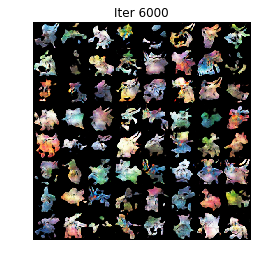

[461/1000][8/13]	Loss_D: -1.0413	Loss_G: 0.6213
[461/1000][9/13]	Loss_D: -0.9519	Loss_G: 0.0183
[461/1000][10/13]	Loss_D: -0.9522	Loss_G: 0.5903
[461/1000][11/13]	Loss_D: -1.0131	Loss_G: 0.4142
[461/1000][12/13]	Loss_D: -0.9720	Loss_G: 0.6352
[462/1000][0/13]	Loss_D: -1.1195	Loss_G: 0.5295
[462/1000][1/13]	Loss_D: -1.0931	Loss_G: 0.5794
[462/1000][2/13]	Loss_D: -1.1315	Loss_G: 0.5294
[462/1000][3/13]	Loss_D: -1.0706	Loss_G: 0.5986
[462/1000][4/13]	Loss_D: -0.9451	Loss_G: 0.2342
[462/1000][5/13]	Loss_D: -0.7473	Loss_G: 0.6252
[462/1000][6/13]	Loss_D: -0.8805	Loss_G: 0.1464
[462/1000][7/13]	Loss_D: -0.9369	Loss_G: 0.6330
[462/1000][8/13]	Loss_D: -1.1220	Loss_G: 0.5340
[462/1000][9/13]	Loss_D: -1.1335	Loss_G: 0.5809
[462/1000][10/13]	Loss_D: -0.9974	Loss_G: 0.3442
[462/1000][11/13]	Loss_D: -0.9072	Loss_G: 0.6164
[462/1000][12/13]	Loss_D: -0.8958	Loss_G: 0.1774
[463/1000][0/13]	Loss_D: -0.8837	Loss_G: 0.6453
[463/1000][1/13]	Loss_D: -1.0007	Loss_G: 0.4005
[463/1000][2/13]	Loss_D: -1.0688	L

[474/1000][10/13]	Loss_D: -0.5490	Loss_G: 0.5424
[474/1000][11/13]	Loss_D: -0.9483	Loss_G: 0.5243
[474/1000][12/13]	Loss_D: -0.9961	Loss_G: 0.2892
[475/1000][0/13]	Loss_D: -0.8072	Loss_G: 0.6379
[475/1000][1/13]	Loss_D: -0.8741	Loss_G: 0.3156
[475/1000][2/13]	Loss_D: -0.9840	Loss_G: 0.6105
[475/1000][3/13]	Loss_D: -1.0581	Loss_G: 0.4637
[475/1000][4/13]	Loss_D: -1.0890	Loss_G: 0.6018
[475/1000][5/13]	Loss_D: -1.0150	Loss_G: 0.3551
[475/1000][6/13]	Loss_D: -0.9819	Loss_G: 0.6113
[475/1000][7/13]	Loss_D: -1.0503	Loss_G: 0.4395
[475/1000][8/13]	Loss_D: -0.9142	Loss_G: 0.6364
[475/1000][9/13]	Loss_D: -0.8843	Loss_G: 0.1392
[475/1000][10/13]	Loss_D: -0.9215	Loss_G: 0.6105
[475/1000][11/13]	Loss_D: -1.0914	Loss_G: 0.4571
[475/1000][12/13]	Loss_D: -1.0266	Loss_G: 0.6092
[476/1000][0/13]	Loss_D: -1.0934	Loss_G: 0.4916
[476/1000][1/13]	Loss_D: -1.0934	Loss_G: 0.5943
[476/1000][2/13]	Loss_D: -1.0313	Loss_G: 0.3879
[476/1000][3/13]	Loss_D: -1.0766	Loss_G: 0.6142
[476/1000][4/13]	Loss_D: -0.8895	L

[487/1000][11/13]	Loss_D: -0.7879	Loss_G: 0.6221
[487/1000][12/13]	Loss_D: -1.1327	Loss_G: 0.5212
[488/1000][0/13]	Loss_D: -1.1102	Loss_G: 0.5545
[488/1000][1/13]	Loss_D: -0.9252	Loss_G: 0.3021
[488/1000][2/13]	Loss_D: -0.9776	Loss_G: 0.6253
[488/1000][3/13]	Loss_D: -0.9626	Loss_G: 0.3133
[488/1000][4/13]	Loss_D: -0.8774	Loss_G: 0.6368
[488/1000][5/13]	Loss_D: -1.0611	Loss_G: 0.4673
[488/1000][6/13]	Loss_D: -1.0422	Loss_G: 0.6042
[488/1000][7/13]	Loss_D: -1.0554	Loss_G: 0.4447
[488/1000][8/13]	Loss_D: -0.9499	Loss_G: 0.6153
[488/1000][9/13]	Loss_D: -0.9856	Loss_G: 0.2460
[488/1000][10/13]	Loss_D: -0.6380	Loss_G: 0.6185
[488/1000][11/13]	Loss_D: -0.9934	Loss_G: 0.4583
[488/1000][12/13]	Loss_D: -0.9974	Loss_G: 0.5921
[489/1000][0/13]	Loss_D: -1.0092	Loss_G: 0.4186
[489/1000][1/13]	Loss_D: -1.0977	Loss_G: 0.5908
[489/1000][2/13]	Loss_D: -1.0554	Loss_G: 0.4814
[489/1000][3/13]	Loss_D: -1.0593	Loss_G: 0.5784
[489/1000][4/13]	Loss_D: -1.0868	Loss_G: 0.4877
[489/1000][5/13]	Loss_D: -1.0086	Lo

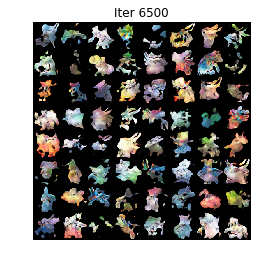

[500/1000][1/13]	Loss_D: -1.0710	Loss_G: 0.4752
[500/1000][2/13]	Loss_D: -1.1070	Loss_G: 0.5909
[500/1000][3/13]	Loss_D: -1.0268	Loss_G: 0.3979
[500/1000][4/13]	Loss_D: -0.9753	Loss_G: 0.6239
[500/1000][5/13]	Loss_D: -1.0382	Loss_G: 0.4420
[500/1000][6/13]	Loss_D: -0.7546	Loss_G: 0.6004
[500/1000][7/13]	Loss_D: -0.7564	Loss_G: 0.6278
[500/1000][8/13]	Loss_D: -0.8744	Loss_G: 0.2730
[500/1000][9/13]	Loss_D: -1.0185	Loss_G: 0.5864
[500/1000][10/13]	Loss_D: -0.9797	Loss_G: 0.3193
[500/1000][11/13]	Loss_D: -1.0760	Loss_G: 0.5956
[500/1000][12/13]	Loss_D: -1.0299	Loss_G: 0.4094
[501/1000][0/13]	Loss_D: -0.9846	Loss_G: 0.5996
[501/1000][1/13]	Loss_D: -1.0483	Loss_G: 0.4713
[501/1000][2/13]	Loss_D: -0.9966	Loss_G: 0.5889
[501/1000][3/13]	Loss_D: -1.0640	Loss_G: 0.4392
[501/1000][4/13]	Loss_D: -1.0091	Loss_G: 0.6093
[501/1000][5/13]	Loss_D: -0.9545	Loss_G: 0.2626
[501/1000][6/13]	Loss_D: -0.3650	Loss_G: 0.5952
[501/1000][7/13]	Loss_D: -0.9858	Loss_G: 0.4376
[501/1000][8/13]	Loss_D: -1.0940	Loss

[513/1000][2/13]	Loss_D: -1.0194	Loss_G: 0.4377
[513/1000][3/13]	Loss_D: -1.0580	Loss_G: 0.5834
[513/1000][4/13]	Loss_D: -0.9763	Loss_G: 0.2454
[513/1000][5/13]	Loss_D: -0.9102	Loss_G: 0.6013
[513/1000][6/13]	Loss_D: -1.0043	Loss_G: 0.3911
[513/1000][7/13]	Loss_D: -0.9630	Loss_G: 0.6155
[513/1000][8/13]	Loss_D: -0.9918	Loss_G: 0.3716
[513/1000][9/13]	Loss_D: -0.8443	Loss_G: 0.6105
[513/1000][10/13]	Loss_D: -0.7798	Loss_G: -0.1279
[513/1000][11/13]	Loss_D: -0.9867	Loss_G: 0.6049
[513/1000][12/13]	Loss_D: -1.0208	Loss_G: 0.4313
[514/1000][0/13]	Loss_D: -0.9788	Loss_G: 0.6064
[514/1000][1/13]	Loss_D: -1.0631	Loss_G: 0.4164
[514/1000][2/13]	Loss_D: -0.8518	Loss_G: 0.6145
[514/1000][3/13]	Loss_D: -1.0344	Loss_G: 0.4107
[514/1000][4/13]	Loss_D: -0.9057	Loss_G: 0.6069
[514/1000][5/13]	Loss_D: -0.8407	Loss_G: -0.0449
[514/1000][6/13]	Loss_D: -0.9831	Loss_G: 0.5982
[514/1000][7/13]	Loss_D: -1.0958	Loss_G: 0.5153
[514/1000][8/13]	Loss_D: -1.0908	Loss_G: 0.5673
[514/1000][9/13]	Loss_D: -1.0446	Lo

[526/1000][3/13]	Loss_D: -0.9527	Loss_G: 0.1213
[526/1000][4/13]	Loss_D: -0.6611	Loss_G: 0.5813
[526/1000][5/13]	Loss_D: -0.8372	Loss_G: 0.3719
[526/1000][6/13]	Loss_D: -0.8962	Loss_G: 0.5938
[526/1000][7/13]	Loss_D: -1.0300	Loss_G: 0.4142
[526/1000][8/13]	Loss_D: -1.0462	Loss_G: 0.5962
[526/1000][9/13]	Loss_D: -0.9840	Loss_G: 0.3722
[526/1000][10/13]	Loss_D: -0.9398	Loss_G: 0.6062
[526/1000][11/13]	Loss_D: -0.9880	Loss_G: 0.3958
[526/1000][12/13]	Loss_D: -1.0550	Loss_G: 0.5838
[527/1000][0/13]	Loss_D: -1.0582	Loss_G: 0.4494
[527/1000][1/13]	Loss_D: -1.0260	Loss_G: 0.5986
[527/1000][2/13]	Loss_D: -1.0487	Loss_G: 0.4210
[527/1000][3/13]	Loss_D: -0.9609	Loss_G: 0.6109
[527/1000][4/13]	Loss_D: -0.9888	Loss_G: 0.2941
[527/1000][5/13]	Loss_D: -0.8595	Loss_G: 0.6080
[527/1000][6/13]	Loss_D: -0.4822	Loss_G: 0.4223
[527/1000][7/13]	Loss_D: -0.9825	Loss_G: 0.5970
[527/1000][8/13]	Loss_D: -0.9525	Loss_G: 0.2591
[527/1000][9/13]	Loss_D: -0.8163	Loss_G: 0.5565
[527/1000][10/13]	Loss_D: -0.9911	Los

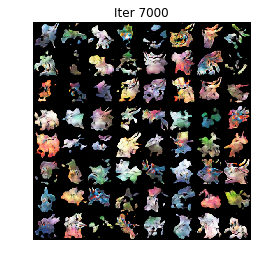

[538/1000][7/13]	Loss_D: -0.9887	Loss_G: 0.5828
[538/1000][8/13]	Loss_D: -1.0018	Loss_G: 0.4245
[538/1000][9/13]	Loss_D: -1.0257	Loss_G: 0.5792
[538/1000][10/13]	Loss_D: -0.9872	Loss_G: 0.3677
[538/1000][11/13]	Loss_D: -0.9427	Loss_G: 0.6141
[538/1000][12/13]	Loss_D: -0.9894	Loss_G: 0.3518
[539/1000][0/13]	Loss_D: -1.0474	Loss_G: 0.5731
[539/1000][1/13]	Loss_D: -1.0732	Loss_G: 0.4802
[539/1000][2/13]	Loss_D: -1.0466	Loss_G: 0.5804
[539/1000][3/13]	Loss_D: -0.9681	Loss_G: 0.3544
[539/1000][4/13]	Loss_D: -0.9845	Loss_G: 0.6003
[539/1000][5/13]	Loss_D: -0.6435	Loss_G: -0.2252
[539/1000][6/13]	Loss_D: -0.9975	Loss_G: 0.6053
[539/1000][7/13]	Loss_D: -0.9145	Loss_G: 0.2733
[539/1000][8/13]	Loss_D: -0.9544	Loss_G: 0.5987
[539/1000][9/13]	Loss_D: -0.9860	Loss_G: 0.3952
[539/1000][10/13]	Loss_D: -0.9036	Loss_G: 0.6123
[539/1000][11/13]	Loss_D: -1.0504	Loss_G: 0.4545
[539/1000][12/13]	Loss_D: -1.0018	Loss_G: 0.5771
[540/1000][0/13]	Loss_D: -1.0552	Loss_G: 0.4406
[540/1000][1/13]	Loss_D: -1.0569	

[551/1000][8/13]	Loss_D: -1.0147	Loss_G: 0.4407
[551/1000][9/13]	Loss_D: -0.9895	Loss_G: 0.5958
[551/1000][10/13]	Loss_D: -0.9756	Loss_G: 0.3657
[551/1000][11/13]	Loss_D: -0.8774	Loss_G: 0.5905
[551/1000][12/13]	Loss_D: -0.8667	Loss_G: 0.2373
[552/1000][0/13]	Loss_D: -0.4743	Loss_G: 0.5814
[552/1000][1/13]	Loss_D: -1.0555	Loss_G: 0.4543
[552/1000][2/13]	Loss_D: -1.0607	Loss_G: 0.5898
[552/1000][3/13]	Loss_D: -1.0024	Loss_G: 0.3871
[552/1000][4/13]	Loss_D: -0.9748	Loss_G: 0.5943
[552/1000][5/13]	Loss_D: -1.0977	Loss_G: 0.5103
[552/1000][6/13]	Loss_D: -1.0670	Loss_G: 0.5435
[552/1000][7/13]	Loss_D: -0.9887	Loss_G: 0.3547
[552/1000][8/13]	Loss_D: -0.9398	Loss_G: 0.6102
[552/1000][9/13]	Loss_D: -0.9546	Loss_G: 0.1702
[552/1000][10/13]	Loss_D: -0.5411	Loss_G: 0.2772
[552/1000][11/13]	Loss_D: -0.8755	Loss_G: 0.5997
[552/1000][12/13]	Loss_D: -0.9656	Loss_G: 0.3724
[553/1000][0/13]	Loss_D: -0.9430	Loss_G: 0.6131
[553/1000][1/13]	Loss_D: -1.0434	Loss_G: 0.4072
[553/1000][2/13]	Loss_D: -0.9552	L

[564/1000][9/13]	Loss_D: -0.8949	Loss_G: -0.0881
[564/1000][10/13]	Loss_D: -0.8762	Loss_G: 0.6104
[564/1000][11/13]	Loss_D: -1.0369	Loss_G: 0.4218
[564/1000][12/13]	Loss_D: -0.9308	Loss_G: 0.6218
[565/1000][0/13]	Loss_D: -0.8823	Loss_G: 0.1014
[565/1000][1/13]	Loss_D: -0.7228	Loss_G: 0.6212
[565/1000][2/13]	Loss_D: -1.0732	Loss_G: 0.4986
[565/1000][3/13]	Loss_D: -1.0897	Loss_G: 0.5783
[565/1000][4/13]	Loss_D: -0.9554	Loss_G: 0.3583
[565/1000][5/13]	Loss_D: -0.9191	Loss_G: 0.6160
[565/1000][6/13]	Loss_D: -0.9363	Loss_G: 0.3735
[565/1000][7/13]	Loss_D: -0.9415	Loss_G: 0.6117
[565/1000][8/13]	Loss_D: -1.0343	Loss_G: 0.4520
[565/1000][9/13]	Loss_D: -0.9962	Loss_G: 0.5589
[565/1000][10/13]	Loss_D: -1.0291	Loss_G: 0.4065
[565/1000][11/13]	Loss_D: -0.7845	Loss_G: 0.6381
[565/1000][12/13]	Loss_D: -0.9462	Loss_G: 0.3139
[566/1000][0/13]	Loss_D: -0.9360	Loss_G: 0.6008
[566/1000][1/13]	Loss_D: -0.9390	Loss_G: 0.3487
[566/1000][2/13]	Loss_D: -0.9642	Loss_G: 0.5840
[566/1000][3/13]	Loss_D: -1.0131	

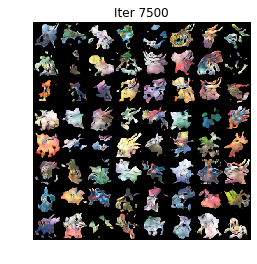

[577/1000][0/13]	Loss_D: -1.0586	Loss_G: 0.4700
[577/1000][1/13]	Loss_D: -0.9837	Loss_G: 0.5828
[577/1000][2/13]	Loss_D: -0.9938	Loss_G: 0.3658
[577/1000][3/13]	Loss_D: -0.9118	Loss_G: 0.6152
[577/1000][4/13]	Loss_D: -0.7517	Loss_G: -0.1250
[577/1000][5/13]	Loss_D: -0.8558	Loss_G: 0.5957
[577/1000][6/13]	Loss_D: -1.0098	Loss_G: 0.4052
[577/1000][7/13]	Loss_D: -0.9886	Loss_G: 0.6045
[577/1000][8/13]	Loss_D: -0.9228	Loss_G: 0.3046
[577/1000][9/13]	Loss_D: -0.8981	Loss_G: 0.5979
[577/1000][10/13]	Loss_D: -0.9630	Loss_G: 0.3387
[577/1000][11/13]	Loss_D: -0.8557	Loss_G: 0.6124
[577/1000][12/13]	Loss_D: -1.0366	Loss_G: 0.5027
[578/1000][0/13]	Loss_D: -1.0338	Loss_G: 0.4404
[578/1000][1/13]	Loss_D: -1.0395	Loss_G: 0.5920
[578/1000][2/13]	Loss_D: -1.0342	Loss_G: 0.4251
[578/1000][3/13]	Loss_D: -0.9072	Loss_G: 0.6300
[578/1000][4/13]	Loss_D: -0.9146	Loss_G: 0.0659
[578/1000][5/13]	Loss_D: -0.8154	Loss_G: 0.5945
[578/1000][6/13]	Loss_D: -0.8503	Loss_G: 0.1273
[578/1000][7/13]	Loss_D: -0.8626	Los

[590/1000][2/13]	Loss_D: -0.9749	Loss_G: 0.6037
[590/1000][3/13]	Loss_D: -0.9350	Loss_G: 0.2302
[590/1000][4/13]	Loss_D: -0.6369	Loss_G: 0.5836
[590/1000][5/13]	Loss_D: -0.9322	Loss_G: 0.3650
[590/1000][6/13]	Loss_D: -0.9292	Loss_G: 0.5818
[590/1000][7/13]	Loss_D: -0.9958	Loss_G: 0.4134
[590/1000][8/13]	Loss_D: -1.0241	Loss_G: 0.5707
[590/1000][9/13]	Loss_D: -0.9496	Loss_G: 0.3643
[590/1000][10/13]	Loss_D: -0.8960	Loss_G: 0.5962
[590/1000][11/13]	Loss_D: -0.9447	Loss_G: 0.4111
[590/1000][12/13]	Loss_D: -0.8943	Loss_G: 0.5989
[591/1000][0/13]	Loss_D: -1.0142	Loss_G: 0.4618
[591/1000][1/13]	Loss_D: -1.0383	Loss_G: 0.5758
[591/1000][2/13]	Loss_D: -0.9600	Loss_G: 0.3531
[591/1000][3/13]	Loss_D: -0.9791	Loss_G: 0.6051
[591/1000][4/13]	Loss_D: -0.8846	Loss_G: -0.0368
[591/1000][5/13]	Loss_D: -0.8354	Loss_G: 0.6156
[591/1000][6/13]	Loss_D: -0.8734	Loss_G: 0.3958
[591/1000][7/13]	Loss_D: -0.8750	Loss_G: 0.6064
[591/1000][8/13]	Loss_D: -0.8655	Loss_G: 0.3062
[591/1000][9/13]	Loss_D: -0.9035	Los

[603/1000][3/13]	Loss_D: -0.9720	Loss_G: 0.4228
[603/1000][4/13]	Loss_D: -0.9307	Loss_G: 0.5960
[603/1000][5/13]	Loss_D: -0.9536	Loss_G: 0.3407
[603/1000][6/13]	Loss_D: -0.7250	Loss_G: 0.5630
[603/1000][7/13]	Loss_D: -0.9125	Loss_G: 0.3165
[603/1000][8/13]	Loss_D: -0.9670	Loss_G: 0.5812
[603/1000][9/13]	Loss_D: -0.9377	Loss_G: 0.3392
[603/1000][10/13]	Loss_D: -0.9476	Loss_G: 0.5967
[603/1000][11/13]	Loss_D: -1.0231	Loss_G: 0.4361
[603/1000][12/13]	Loss_D: -0.9978	Loss_G: 0.5744
[604/1000][0/13]	Loss_D: -1.0090	Loss_G: 0.3947
[604/1000][1/13]	Loss_D: -0.9704	Loss_G: 0.5801
[604/1000][2/13]	Loss_D: -0.9719	Loss_G: 0.3302
[604/1000][3/13]	Loss_D: -0.8180	Loss_G: 0.5953
[604/1000][4/13]	Loss_D: -1.0177	Loss_G: 0.3811
[604/1000][5/13]	Loss_D: -0.9699	Loss_G: 0.5944
[604/1000][6/13]	Loss_D: -0.9377	Loss_G: 0.3451
[604/1000][7/13]	Loss_D: -0.8129	Loss_G: 0.5614
[604/1000][8/13]	Loss_D: -0.9637	Loss_G: 0.3691
[604/1000][9/13]	Loss_D: -1.0131	Loss_G: 0.5865
[604/1000][10/13]	Loss_D: -0.9933	Los

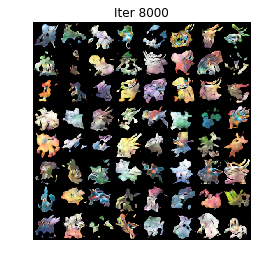

[615/1000][6/13]	Loss_D: -1.0014	Loss_G: 0.3641
[615/1000][7/13]	Loss_D: -0.9650	Loss_G: 0.5992
[615/1000][8/13]	Loss_D: -1.0064	Loss_G: 0.4231
[615/1000][9/13]	Loss_D: -0.9550	Loss_G: 0.6026
[615/1000][10/13]	Loss_D: -0.9052	Loss_G: 0.2171
[615/1000][11/13]	Loss_D: -0.9544	Loss_G: 0.6036
[615/1000][12/13]	Loss_D: -0.9885	Loss_G: 0.4166
[616/1000][0/13]	Loss_D: -1.0087	Loss_G: 0.5694
[616/1000][1/13]	Loss_D: -1.0051	Loss_G: 0.3999
[616/1000][2/13]	Loss_D: -0.9540	Loss_G: 0.5890
[616/1000][3/13]	Loss_D: -0.8689	Loss_G: -0.1193
[616/1000][4/13]	Loss_D: -0.8906	Loss_G: 0.6091
[616/1000][5/13]	Loss_D: -0.9418	Loss_G: 0.3132
[616/1000][6/13]	Loss_D: -0.9155	Loss_G: 0.5992
[616/1000][7/13]	Loss_D: -0.8522	Loss_G: 0.3305
[616/1000][8/13]	Loss_D: -0.8849	Loss_G: 0.6146
[616/1000][9/13]	Loss_D: -0.9386	Loss_G: 0.2894
[616/1000][10/13]	Loss_D: -0.8960	Loss_G: 0.5788
[616/1000][11/13]	Loss_D: -0.8599	Loss_G: 0.2014
[616/1000][12/13]	Loss_D: -0.8065	Loss_G: 0.6098
[617/1000][0/13]	Loss_D: -1.0502	

[628/1000][7/13]	Loss_D: -0.9933	Loss_G: 0.5822
[628/1000][8/13]	Loss_D: -0.8683	Loss_G: 0.3605
[628/1000][9/13]	Loss_D: -0.9360	Loss_G: 0.6038
[628/1000][10/13]	Loss_D: -0.9629	Loss_G: 0.3463
[628/1000][11/13]	Loss_D: -0.9663	Loss_G: 0.5816
[628/1000][12/13]	Loss_D: -0.8802	Loss_G: 0.2342
[629/1000][0/13]	Loss_D: -0.9731	Loss_G: 0.5974
[629/1000][1/13]	Loss_D: -1.0527	Loss_G: 0.4333
[629/1000][2/13]	Loss_D: -0.9402	Loss_G: 0.5834
[629/1000][3/13]	Loss_D: -0.8886	Loss_G: 0.3094
[629/1000][4/13]	Loss_D: -0.9201	Loss_G: 0.6119
[629/1000][5/13]	Loss_D: -1.0096	Loss_G: 0.4071
[629/1000][6/13]	Loss_D: -1.0145	Loss_G: 0.5777
[629/1000][7/13]	Loss_D: -0.9977	Loss_G: 0.3679
[629/1000][8/13]	Loss_D: -0.9445	Loss_G: 0.5865
[629/1000][9/13]	Loss_D: -0.7875	Loss_G: 0.2437
[629/1000][10/13]	Loss_D: -0.7435	Loss_G: 0.5749
[629/1000][11/13]	Loss_D: -0.8907	Loss_G: 0.3183
[629/1000][12/13]	Loss_D: -0.9573	Loss_G: 0.5941
[630/1000][0/13]	Loss_D: -0.9517	Loss_G: 0.3686
[630/1000][1/13]	Loss_D: -0.8570	L

[641/1000][8/13]	Loss_D: -0.8796	Loss_G: 0.5885
[641/1000][9/13]	Loss_D: -0.9022	Loss_G: 0.3477
[641/1000][10/13]	Loss_D: -0.9232	Loss_G: 0.5850
[641/1000][11/13]	Loss_D: -1.0005	Loss_G: 0.4446
[641/1000][12/13]	Loss_D: -0.9593	Loss_G: 0.5920
[642/1000][0/13]	Loss_D: -0.8068	Loss_G: -0.2315
[642/1000][1/13]	Loss_D: -0.9778	Loss_G: 0.5853
[642/1000][2/13]	Loss_D: -0.9568	Loss_G: 0.3444
[642/1000][3/13]	Loss_D: -0.9536	Loss_G: 0.5860
[642/1000][4/13]	Loss_D: -1.0077	Loss_G: 0.3901
[642/1000][5/13]	Loss_D: -0.9435	Loss_G: 0.5995
[642/1000][6/13]	Loss_D: -0.9432	Loss_G: 0.3357
[642/1000][7/13]	Loss_D: -1.0021	Loss_G: 0.5705
[642/1000][8/13]	Loss_D: -0.9361	Loss_G: 0.2785
[642/1000][9/13]	Loss_D: -0.9380	Loss_G: 0.5964
[642/1000][10/13]	Loss_D: -0.9129	Loss_G: 0.0917
[642/1000][11/13]	Loss_D: -0.5192	Loss_G: 0.5829
[642/1000][12/13]	Loss_D: -0.9879	Loss_G: 0.3941
[643/1000][0/13]	Loss_D: -0.9942	Loss_G: 0.5765
[643/1000][1/13]	Loss_D: -0.9700	Loss_G: 0.3393
[643/1000][2/13]	Loss_D: -0.9364	

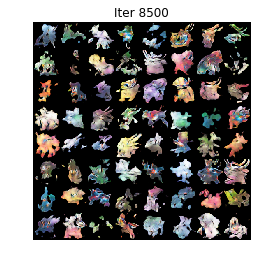

[653/1000][12/13]	Loss_D: -0.9570	Loss_G: 0.5931
[654/1000][0/13]	Loss_D: -0.9484	Loss_G: 0.3855
[654/1000][1/13]	Loss_D: -0.9651	Loss_G: 0.5830
[654/1000][2/13]	Loss_D: -0.9715	Loss_G: 0.3698
[654/1000][3/13]	Loss_D: -0.9229	Loss_G: 0.5882
[654/1000][4/13]	Loss_D: -0.9928	Loss_G: 0.3942
[654/1000][5/13]	Loss_D: -0.9350	Loss_G: 0.5726
[654/1000][6/13]	Loss_D: -0.8590	Loss_G: 0.2569
[654/1000][7/13]	Loss_D: -0.9043	Loss_G: 0.5886
[654/1000][8/13]	Loss_D: -0.9761	Loss_G: 0.3750
[654/1000][9/13]	Loss_D: -0.9644	Loss_G: 0.5799
[654/1000][10/13]	Loss_D: -1.0078	Loss_G: 0.4232
[654/1000][11/13]	Loss_D: -0.9895	Loss_G: 0.5686
[654/1000][12/13]	Loss_D: -0.9545	Loss_G: 0.2944
[655/1000][0/13]	Loss_D: -0.5021	Loss_G: 0.5041
[655/1000][1/13]	Loss_D: -0.8512	Loss_G: 0.3018
[655/1000][2/13]	Loss_D: -0.9173	Loss_G: 0.5826
[655/1000][3/13]	Loss_D: -0.9698	Loss_G: 0.3860
[655/1000][4/13]	Loss_D: -0.9041	Loss_G: 0.5843
[655/1000][5/13]	Loss_D: -0.9688	Loss_G: 0.4205
[655/1000][6/13]	Loss_D: -0.9825	Los

[667/1000][0/13]	Loss_D: -0.9663	Loss_G: 0.4110
[667/1000][1/13]	Loss_D: -0.9773	Loss_G: 0.5789
[667/1000][2/13]	Loss_D: -0.9502	Loss_G: 0.3585
[667/1000][3/13]	Loss_D: -0.9362	Loss_G: 0.5773
[667/1000][4/13]	Loss_D: -0.9204	Loss_G: 0.4098
[667/1000][5/13]	Loss_D: -1.0291	Loss_G: 0.5781
[667/1000][6/13]	Loss_D: -0.8830	Loss_G: 0.2782
[667/1000][7/13]	Loss_D: -0.9348	Loss_G: 0.5813
[667/1000][8/13]	Loss_D: -0.9218	Loss_G: 0.3410
[667/1000][9/13]	Loss_D: -0.8969	Loss_G: 0.6030
[667/1000][10/13]	Loss_D: -0.8163	Loss_G: 0.1830
[667/1000][11/13]	Loss_D: -0.8997	Loss_G: 0.5961
[667/1000][12/13]	Loss_D: -1.0202	Loss_G: 0.4220
[668/1000][0/13]	Loss_D: -1.0144	Loss_G: 0.5771
[668/1000][1/13]	Loss_D: -1.0135	Loss_G: 0.3873
[668/1000][2/13]	Loss_D: -1.0101	Loss_G: 0.5641
[668/1000][3/13]	Loss_D: -0.9840	Loss_G: 0.4007
[668/1000][4/13]	Loss_D: -0.8620	Loss_G: 0.5825
[668/1000][5/13]	Loss_D: -0.9264	Loss_G: 0.2767
[668/1000][6/13]	Loss_D: -0.9098	Loss_G: 0.6090
[668/1000][7/13]	Loss_D: -0.9239	Loss

[680/1000][1/13]	Loss_D: -0.9957	Loss_G: 0.5738
[680/1000][2/13]	Loss_D: -0.9998	Loss_G: 0.4212
[680/1000][3/13]	Loss_D: -0.8906	Loss_G: 0.5646
[680/1000][4/13]	Loss_D: -0.9940	Loss_G: 0.3897
[680/1000][5/13]	Loss_D: -0.8205	Loss_G: 0.5877
[680/1000][6/13]	Loss_D: -0.8444	Loss_G: 0.2595
[680/1000][7/13]	Loss_D: -0.8875	Loss_G: 0.5806
[680/1000][8/13]	Loss_D: -0.9675	Loss_G: 0.3920
[680/1000][9/13]	Loss_D: -0.9085	Loss_G: 0.5766
[680/1000][10/13]	Loss_D: -0.9416	Loss_G: 0.3647
[680/1000][11/13]	Loss_D: -0.9553	Loss_G: 0.5816
[680/1000][12/13]	Loss_D: -0.9185	Loss_G: 0.3567
[681/1000][0/13]	Loss_D: -0.9811	Loss_G: 0.5700
[681/1000][1/13]	Loss_D: -0.9008	Loss_G: 0.1139
[681/1000][2/13]	Loss_D: -0.9365	Loss_G: 0.5915
[681/1000][3/13]	Loss_D: -0.7947	Loss_G: 0.0273
[681/1000][4/13]	Loss_D: -0.8615	Loss_G: 0.5909
[681/1000][5/13]	Loss_D: -0.9632	Loss_G: 0.3623
[681/1000][6/13]	Loss_D: -0.9363	Loss_G: 0.5992
[681/1000][7/13]	Loss_D: -0.9891	Loss_G: 0.3977
[681/1000][8/13]	Loss_D: -0.9522	Loss

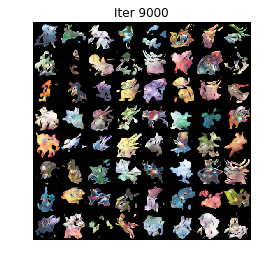

[692/1000][5/13]	Loss_D: -0.9021	Loss_G: 0.5718
[692/1000][6/13]	Loss_D: -0.9177	Loss_G: 0.2100
[692/1000][7/13]	Loss_D: -0.8807	Loss_G: 0.5620
[692/1000][8/13]	Loss_D: -0.8159	Loss_G: 0.2945
[692/1000][9/13]	Loss_D: -0.9560	Loss_G: 0.5723
[692/1000][10/13]	Loss_D: -0.9600	Loss_G: 0.3119
[692/1000][11/13]	Loss_D: -0.9452	Loss_G: 0.5784
[692/1000][12/13]	Loss_D: -0.9156	Loss_G: 0.3369
[693/1000][0/13]	Loss_D: -0.8759	Loss_G: 0.6096
[693/1000][1/13]	Loss_D: -0.9119	Loss_G: 0.3782
[693/1000][2/13]	Loss_D: -1.0000	Loss_G: 0.5667
[693/1000][3/13]	Loss_D: -0.9621	Loss_G: 0.3845
[693/1000][4/13]	Loss_D: -0.8877	Loss_G: 0.5886
[693/1000][5/13]	Loss_D: -0.9128	Loss_G: 0.3357
[693/1000][6/13]	Loss_D: -0.8177	Loss_G: 0.5807
[693/1000][7/13]	Loss_D: -0.9217	Loss_G: 0.3727
[693/1000][8/13]	Loss_D: -0.9397	Loss_G: 0.5763
[693/1000][9/13]	Loss_D: -0.9631	Loss_G: 0.3965
[693/1000][10/13]	Loss_D: -0.9584	Loss_G: 0.5779
[693/1000][11/13]	Loss_D: -0.9268	Loss_G: 0.2419
[693/1000][12/13]	Loss_D: -0.8554	L

[705/1000][6/13]	Loss_D: -0.9817	Loss_G: 0.5543
[705/1000][7/13]	Loss_D: -0.8932	Loss_G: 0.2248
[705/1000][8/13]	Loss_D: -0.8041	Loss_G: 0.5589
[705/1000][9/13]	Loss_D: -0.7867	Loss_G: 0.0727
[705/1000][10/13]	Loss_D: -0.9041	Loss_G: 0.5601
[705/1000][11/13]	Loss_D: -0.9616	Loss_G: 0.4067
[705/1000][12/13]	Loss_D: -0.9571	Loss_G: 0.5914
[706/1000][0/13]	Loss_D: -0.9485	Loss_G: 0.3291
[706/1000][1/13]	Loss_D: -0.9452	Loss_G: 0.5690
[706/1000][2/13]	Loss_D: -0.9983	Loss_G: 0.3414
[706/1000][3/13]	Loss_D: -0.8659	Loss_G: 0.5796
[706/1000][4/13]	Loss_D: -0.9299	Loss_G: 0.3284
[706/1000][5/13]	Loss_D: -0.9665	Loss_G: 0.5769
[706/1000][6/13]	Loss_D: -0.9106	Loss_G: 0.3380
[706/1000][7/13]	Loss_D: -0.9276	Loss_G: 0.5963
[706/1000][8/13]	Loss_D: -0.8671	Loss_G: 0.2535
[706/1000][9/13]	Loss_D: -0.8214	Loss_G: 0.5432
[706/1000][10/13]	Loss_D: -1.0432	Loss_G: 0.4396
[706/1000][11/13]	Loss_D: -0.8703	Loss_G: 0.5801
[706/1000][12/13]	Loss_D: -0.8624	Loss_G: 0.1630
[707/1000][0/13]	Loss_D: -0.9316	L

[718/1000][7/13]	Loss_D: -0.9127	Loss_G: 0.5773
[718/1000][8/13]	Loss_D: -1.0178	Loss_G: 0.4350
[718/1000][9/13]	Loss_D: -0.9972	Loss_G: 0.5687
[718/1000][10/13]	Loss_D: -0.9952	Loss_G: 0.4141
[718/1000][11/13]	Loss_D: -0.8928	Loss_G: 0.5768
[718/1000][12/13]	Loss_D: -0.7748	Loss_G: 0.0522
[719/1000][0/13]	Loss_D: -0.8276	Loss_G: 0.5757
[719/1000][1/13]	Loss_D: -0.9293	Loss_G: 0.3785
[719/1000][2/13]	Loss_D: -0.9788	Loss_G: 0.5695
[719/1000][3/13]	Loss_D: -0.9609	Loss_G: 0.4158
[719/1000][4/13]	Loss_D: -0.9513	Loss_G: 0.5672
[719/1000][5/13]	Loss_D: -0.9501	Loss_G: 0.3949
[719/1000][6/13]	Loss_D: -0.9206	Loss_G: 0.5723
[719/1000][7/13]	Loss_D: -0.8466	Loss_G: 0.2947
[719/1000][8/13]	Loss_D: -0.8906	Loss_G: 0.5849
[719/1000][9/13]	Loss_D: -0.9550	Loss_G: 0.3770
[719/1000][10/13]	Loss_D: -0.9296	Loss_G: 0.5737
[719/1000][11/13]	Loss_D: -0.9306	Loss_G: 0.3464
[719/1000][12/13]	Loss_D: -0.9481	Loss_G: 0.5769
[720/1000][0/13]	Loss_D: -0.8984	Loss_G: 0.3145
[720/1000][1/13]	Loss_D: -0.7591	L

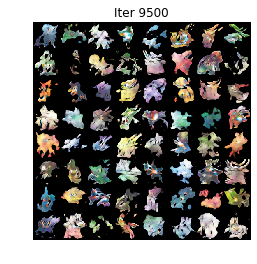

[730/1000][11/13]	Loss_D: -0.9360	Loss_G: 0.5852
[730/1000][12/13]	Loss_D: -0.9816	Loss_G: 0.3657
[731/1000][0/13]	Loss_D: -1.0213	Loss_G: 0.5527
[731/1000][1/13]	Loss_D: -1.0283	Loss_G: 0.4484
[731/1000][2/13]	Loss_D: -0.9979	Loss_G: 0.5324
[731/1000][3/13]	Loss_D: -0.9378	Loss_G: 0.2999
[731/1000][4/13]	Loss_D: -0.8352	Loss_G: 0.5939
[731/1000][5/13]	Loss_D: -0.7497	Loss_G: -0.2419
[731/1000][6/13]	Loss_D: -0.9206	Loss_G: 0.2665
[731/1000][7/13]	Loss_D: -0.8239	Loss_G: 0.5793
[731/1000][8/13]	Loss_D: -0.9209	Loss_G: 0.3960
[731/1000][9/13]	Loss_D: -0.8893	Loss_G: 0.5725
[731/1000][10/13]	Loss_D: -0.9690	Loss_G: 0.4031
[731/1000][11/13]	Loss_D: -0.9464	Loss_G: 0.5729
[731/1000][12/13]	Loss_D: -0.9714	Loss_G: 0.3763
[732/1000][0/13]	Loss_D: -0.8794	Loss_G: 0.5791
[732/1000][1/13]	Loss_D: -0.8897	Loss_G: 0.3300
[732/1000][2/13]	Loss_D: -0.8913	Loss_G: 0.6031
[732/1000][3/13]	Loss_D: -0.9588	Loss_G: 0.3341
[732/1000][4/13]	Loss_D: -0.9484	Loss_G: 0.5855
[732/1000][5/13]	Loss_D: -0.8947	L

[744/1000][0/13]	Loss_D: -0.9549	Loss_G: 0.3211
[744/1000][1/13]	Loss_D: -0.9222	Loss_G: 0.5885
[744/1000][2/13]	Loss_D: -0.8793	Loss_G: 0.1608
[744/1000][3/13]	Loss_D: -0.8690	Loss_G: 0.5953
[744/1000][4/13]	Loss_D: -1.0130	Loss_G: 0.4418
[744/1000][5/13]	Loss_D: -0.9827	Loss_G: 0.5656
[744/1000][6/13]	Loss_D: -0.9375	Loss_G: 0.3535
[744/1000][7/13]	Loss_D: -0.8946	Loss_G: 0.5832
[744/1000][8/13]	Loss_D: -0.9148	Loss_G: 0.3126
[744/1000][9/13]	Loss_D: -0.9102	Loss_G: 0.5767
[744/1000][10/13]	Loss_D: -0.9340	Loss_G: 0.3551
[744/1000][11/13]	Loss_D: -0.9165	Loss_G: 0.5725
[744/1000][12/13]	Loss_D: -0.9804	Loss_G: 0.3740
[745/1000][0/13]	Loss_D: -0.9625	Loss_G: 0.5738
[745/1000][1/13]	Loss_D: -0.9369	Loss_G: 0.3745
[745/1000][2/13]	Loss_D: -0.9456	Loss_G: 0.5726
[745/1000][3/13]	Loss_D: -1.0187	Loss_G: 0.4303
[745/1000][4/13]	Loss_D: -1.0059	Loss_G: 0.5488
[745/1000][5/13]	Loss_D: -0.8929	Loss_G: 0.2794
[745/1000][6/13]	Loss_D: -0.8856	Loss_G: 0.5830
[745/1000][7/13]	Loss_D: -0.9424	Loss

[757/1000][1/13]	Loss_D: -0.9093	Loss_G: 0.2923
[757/1000][2/13]	Loss_D: -0.9126	Loss_G: 0.5839
[757/1000][3/13]	Loss_D: -0.9746	Loss_G: 0.4110
[757/1000][4/13]	Loss_D: -0.9678	Loss_G: 0.5672
[757/1000][5/13]	Loss_D: -0.9851	Loss_G: 0.4121
[757/1000][6/13]	Loss_D: -0.9751	Loss_G: 0.5703
[757/1000][7/13]	Loss_D: -0.9832	Loss_G: 0.3689
[757/1000][8/13]	Loss_D: -0.9669	Loss_G: 0.5874
[757/1000][9/13]	Loss_D: -0.9345	Loss_G: 0.3309
[757/1000][10/13]	Loss_D: -0.7820	Loss_G: 0.5529
[757/1000][11/13]	Loss_D: -0.8598	Loss_G: 0.2994
[757/1000][12/13]	Loss_D: -0.9382	Loss_G: 0.5676
[758/1000][0/13]	Loss_D: -1.0241	Loss_G: 0.4354
[758/1000][1/13]	Loss_D: -1.0092	Loss_G: 0.5723
[758/1000][2/13]	Loss_D: -0.9705	Loss_G: 0.3510
[758/1000][3/13]	Loss_D: -0.9350	Loss_G: 0.5668
[758/1000][4/13]	Loss_D: -0.7041	Loss_G: -0.0843
[758/1000][5/13]	Loss_D: -0.8634	Loss_G: 0.5911
[758/1000][6/13]	Loss_D: -1.0109	Loss_G: 0.4254
[758/1000][7/13]	Loss_D: -0.9482	Loss_G: 0.5769
[758/1000][8/13]	Loss_D: -0.9717	Los

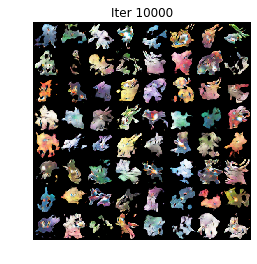

[769/1000][4/13]	Loss_D: -0.9288	Loss_G: 0.5709
[769/1000][5/13]	Loss_D: -0.9108	Loss_G: 0.2447
[769/1000][6/13]	Loss_D: -0.7380	Loss_G: 0.5510
[769/1000][7/13]	Loss_D: -0.9709	Loss_G: 0.4050
[769/1000][8/13]	Loss_D: -0.9298	Loss_G: 0.5710
[769/1000][9/13]	Loss_D: -0.9003	Loss_G: 0.3371
[769/1000][10/13]	Loss_D: -0.9829	Loss_G: 0.5741
[769/1000][11/13]	Loss_D: -0.9328	Loss_G: 0.3323
[769/1000][12/13]	Loss_D: -0.9271	Loss_G: 0.5905
[770/1000][0/13]	Loss_D: -0.9847	Loss_G: 0.3988
[770/1000][1/13]	Loss_D: -0.9423	Loss_G: 0.5605
[770/1000][2/13]	Loss_D: -0.9621	Loss_G: 0.3684
[770/1000][3/13]	Loss_D: -0.8688	Loss_G: 0.5734
[770/1000][4/13]	Loss_D: -0.9561	Loss_G: 0.3898
[770/1000][5/13]	Loss_D: -0.8891	Loss_G: 0.5639
[770/1000][6/13]	Loss_D: -0.9324	Loss_G: 0.3424
[770/1000][7/13]	Loss_D: -0.9306	Loss_G: 0.5703
[770/1000][8/13]	Loss_D: -1.0002	Loss_G: 0.4304
[770/1000][9/13]	Loss_D: -0.8926	Loss_G: 0.5654
[770/1000][10/13]	Loss_D: -0.8842	Loss_G: 0.2993
[770/1000][11/13]	Loss_D: -0.9204	Lo

[782/1000][5/13]	Loss_D: -0.9542	Loss_G: 0.5837
[782/1000][6/13]	Loss_D: -0.9620	Loss_G: 0.3620
[782/1000][7/13]	Loss_D: -0.8793	Loss_G: 0.5756
[782/1000][8/13]	Loss_D: -0.9436	Loss_G: 0.2921
[782/1000][9/13]	Loss_D: -0.9220	Loss_G: 0.5772
[782/1000][10/13]	Loss_D: -0.8780	Loss_G: 0.2817
[782/1000][11/13]	Loss_D: -0.7587	Loss_G: 0.5849
[782/1000][12/13]	Loss_D: -0.9432	Loss_G: 0.3757
[783/1000][0/13]	Loss_D: -0.9881	Loss_G: 0.5853
[783/1000][1/13]	Loss_D: -1.0051	Loss_G: 0.4189
[783/1000][2/13]	Loss_D: -0.9924	Loss_G: 0.5707
[783/1000][3/13]	Loss_D: -0.9494	Loss_G: 0.3564
[783/1000][4/13]	Loss_D: -0.9634	Loss_G: 0.5854
[783/1000][5/13]	Loss_D: -0.8928	Loss_G: 0.2674
[783/1000][6/13]	Loss_D: -0.8839	Loss_G: 0.6016
[783/1000][7/13]	Loss_D: -0.8343	Loss_G: 0.3023
[783/1000][8/13]	Loss_D: -0.9776	Loss_G: 0.5428
[783/1000][9/13]	Loss_D: -0.9496	Loss_G: 0.3964
[783/1000][10/13]	Loss_D: -0.9604	Loss_G: 0.5456
[783/1000][11/13]	Loss_D: -0.9399	Loss_G: 0.3602
[783/1000][12/13]	Loss_D: -0.8716	L

[795/1000][6/13]	Loss_D: -1.0322	Loss_G: 0.4408
[795/1000][7/13]	Loss_D: -0.9538	Loss_G: 0.5840
[795/1000][8/13]	Loss_D: -0.9767	Loss_G: 0.3901
[795/1000][9/13]	Loss_D: -0.8961	Loss_G: 0.5750
[795/1000][10/13]	Loss_D: -0.9113	Loss_G: 0.3255
[795/1000][11/13]	Loss_D: -0.7227	Loss_G: 0.5787
[795/1000][12/13]	Loss_D: -0.9467	Loss_G: 0.4043
[796/1000][0/13]	Loss_D: -0.9612	Loss_G: 0.5765
[796/1000][1/13]	Loss_D: -1.0049	Loss_G: 0.4306
[796/1000][2/13]	Loss_D: -0.9781	Loss_G: 0.5663
[796/1000][3/13]	Loss_D: -0.9477	Loss_G: 0.3716
[796/1000][4/13]	Loss_D: -0.9128	Loss_G: 0.5936
[796/1000][5/13]	Loss_D: -0.8205	Loss_G: 0.1201
[796/1000][6/13]	Loss_D: -0.7879	Loss_G: 0.5878
[796/1000][7/13]	Loss_D: -0.9603	Loss_G: 0.3576
[796/1000][8/13]	Loss_D: -0.9798	Loss_G: 0.5580
[796/1000][9/13]	Loss_D: -0.9021	Loss_G: 0.3610
[796/1000][10/13]	Loss_D: -0.9528	Loss_G: 0.5672
[796/1000][11/13]	Loss_D: -0.8793	Loss_G: 0.2489
[796/1000][12/13]	Loss_D: -0.8026	Loss_G: 0.5853
[797/1000][0/13]	Loss_D: -0.9901	L

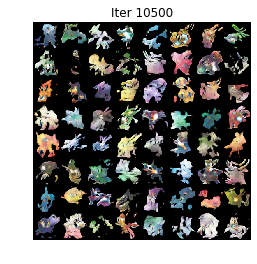

[807/1000][10/13]	Loss_D: -0.9743	Loss_G: 0.4207
[807/1000][11/13]	Loss_D: -0.8824	Loss_G: 0.5800
[807/1000][12/13]	Loss_D: -0.9455	Loss_G: 0.3033
[808/1000][0/13]	Loss_D: -0.9718	Loss_G: 0.5677
[808/1000][1/13]	Loss_D: -0.9695	Loss_G: 0.4054
[808/1000][2/13]	Loss_D: -0.9601	Loss_G: 0.5772
[808/1000][3/13]	Loss_D: -0.9496	Loss_G: 0.3512
[808/1000][4/13]	Loss_D: -0.9207	Loss_G: 0.5675
[808/1000][5/13]	Loss_D: -0.9555	Loss_G: 0.2791
[808/1000][6/13]	Loss_D: -0.8389	Loss_G: 0.5648
[808/1000][7/13]	Loss_D: -0.7469	Loss_G: 0.2557
[808/1000][8/13]	Loss_D: -0.9068	Loss_G: 0.5687
[808/1000][9/13]	Loss_D: -0.9506	Loss_G: 0.3739
[808/1000][10/13]	Loss_D: -0.9418	Loss_G: 0.5640
[808/1000][11/13]	Loss_D: -0.9526	Loss_G: 0.4137
[808/1000][12/13]	Loss_D: -0.8611	Loss_G: 0.5738
[809/1000][0/13]	Loss_D: -0.7493	Loss_G: 0.0931
[809/1000][1/13]	Loss_D: -0.9759	Loss_G: 0.5787
[809/1000][2/13]	Loss_D: -1.0235	Loss_G: 0.4404
[809/1000][3/13]	Loss_D: -0.9879	Loss_G: 0.5641
[809/1000][4/13]	Loss_D: -0.9630	L

[820/1000][11/13]	Loss_D: -0.9887	Loss_G: 0.5628
[820/1000][12/13]	Loss_D: -1.0182	Loss_G: 0.4524
[821/1000][0/13]	Loss_D: -0.9778	Loss_G: 0.5619
[821/1000][1/13]	Loss_D: -0.9402	Loss_G: 0.3249
[821/1000][2/13]	Loss_D: -0.9586	Loss_G: 0.5744
[821/1000][3/13]	Loss_D: -0.9768	Loss_G: 0.3778
[821/1000][4/13]	Loss_D: -0.9264	Loss_G: 0.5650
[821/1000][5/13]	Loss_D: -0.9330	Loss_G: 0.2739
[821/1000][6/13]	Loss_D: -0.9513	Loss_G: 0.5598
[821/1000][7/13]	Loss_D: -1.0099	Loss_G: 0.4348
[821/1000][8/13]	Loss_D: -1.0082	Loss_G: 0.5389
[821/1000][9/13]	Loss_D: -0.9147	Loss_G: 0.2738
[821/1000][10/13]	Loss_D: -0.4742	Loss_G: 0.5856
[821/1000][11/13]	Loss_D: -0.9567	Loss_G: 0.3533
[821/1000][12/13]	Loss_D: -0.8970	Loss_G: 0.5531
[822/1000][0/13]	Loss_D: -0.9550	Loss_G: 0.3428
[822/1000][1/13]	Loss_D: -0.9271	Loss_G: 0.5600
[822/1000][2/13]	Loss_D: -0.9457	Loss_G: 0.3580
[822/1000][3/13]	Loss_D: -0.8889	Loss_G: 0.5850
[822/1000][4/13]	Loss_D: -0.9558	Loss_G: 0.4020
[822/1000][5/13]	Loss_D: -0.8427	Lo

[833/1000][12/13]	Loss_D: -1.0286	Loss_G: 0.5536
[834/1000][0/13]	Loss_D: -1.0102	Loss_G: 0.4134
[834/1000][1/13]	Loss_D: -0.9883	Loss_G: 0.5789
[834/1000][2/13]	Loss_D: -0.9480	Loss_G: 0.3397
[834/1000][3/13]	Loss_D: -0.9303	Loss_G: 0.5655
[834/1000][4/13]	Loss_D: -0.9523	Loss_G: 0.3082
[834/1000][5/13]	Loss_D: -0.9532	Loss_G: 0.5687
[834/1000][6/13]	Loss_D: -0.9568	Loss_G: 0.3773
[834/1000][7/13]	Loss_D: -0.9528	Loss_G: 0.5646
[834/1000][8/13]	Loss_D: -0.9039	Loss_G: 0.2730
[834/1000][9/13]	Loss_D: -0.9321	Loss_G: 0.5714
[834/1000][10/13]	Loss_D: -1.0048	Loss_G: 0.4029
[834/1000][11/13]	Loss_D: -0.9503	Loss_G: 0.5679
[834/1000][12/13]	Loss_D: -0.8065	Loss_G: -0.1022
[835/1000][0/13]	Loss_D: -1.0209	Loss_G: 0.5538
[835/1000][1/13]	Loss_D: -0.9365	Loss_G: 0.3351
[835/1000][2/13]	Loss_D: -0.9152	Loss_G: 0.5887
[835/1000][3/13]	Loss_D: -0.9480	Loss_G: 0.3530
[835/1000][4/13]	Loss_D: -0.9134	Loss_G: 0.5831
[835/1000][5/13]	Loss_D: -0.9560	Loss_G: 0.4003
[835/1000][6/13]	Loss_D: -0.9556	Lo

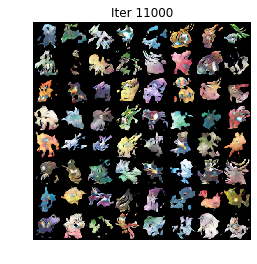

[846/1000][3/13]	Loss_D: -0.9237	Loss_G: 0.5698
[846/1000][4/13]	Loss_D: -0.8332	Loss_G: 0.2412
[846/1000][5/13]	Loss_D: -0.9301	Loss_G: 0.5878
[846/1000][6/13]	Loss_D: -0.8434	Loss_G: 0.1780
[846/1000][7/13]	Loss_D: -0.9298	Loss_G: 0.5716
[846/1000][8/13]	Loss_D: -0.9396	Loss_G: 0.3925
[846/1000][9/13]	Loss_D: -0.9345	Loss_G: 0.5731
[846/1000][10/13]	Loss_D: -0.9121	Loss_G: 0.3320
[846/1000][11/13]	Loss_D: -0.9266	Loss_G: 0.5688
[846/1000][12/13]	Loss_D: -0.9924	Loss_G: 0.4205
[847/1000][0/13]	Loss_D: -0.9591	Loss_G: 0.5743
[847/1000][1/13]	Loss_D: -0.9660	Loss_G: 0.3624
[847/1000][2/13]	Loss_D: -0.9728	Loss_G: 0.5702
[847/1000][3/13]	Loss_D: -0.9741	Loss_G: 0.3893
[847/1000][4/13]	Loss_D: -0.9615	Loss_G: 0.5721
[847/1000][5/13]	Loss_D: -0.9641	Loss_G: 0.3884
[847/1000][6/13]	Loss_D: -0.8823	Loss_G: 0.5668
[847/1000][7/13]	Loss_D: -0.9309	Loss_G: 0.3440
[847/1000][8/13]	Loss_D: -0.8837	Loss_G: 0.5733
[847/1000][9/13]	Loss_D: -0.9504	Loss_G: 0.3878
[847/1000][10/13]	Loss_D: -0.8749	Los

[859/1000][5/13]	Loss_D: -0.9003	Loss_G: 0.2616
[859/1000][6/13]	Loss_D: -0.6592	Loss_G: 0.5919
[859/1000][7/13]	Loss_D: -0.8740	Loss_G: 0.3286
[859/1000][8/13]	Loss_D: -0.9457	Loss_G: 0.5594
[859/1000][9/13]	Loss_D: -0.9535	Loss_G: 0.3918
[859/1000][10/13]	Loss_D: -1.0073	Loss_G: 0.5664
[859/1000][11/13]	Loss_D: -0.9504	Loss_G: 0.3485
[859/1000][12/13]	Loss_D: -0.9536	Loss_G: 0.5741
[860/1000][0/13]	Loss_D: -0.9335	Loss_G: 0.3532
[860/1000][1/13]	Loss_D: -0.9149	Loss_G: 0.5740
[860/1000][2/13]	Loss_D: -0.9789	Loss_G: 0.4106
[860/1000][3/13]	Loss_D: -0.9756	Loss_G: 0.5714
[860/1000][4/13]	Loss_D: -0.9837	Loss_G: 0.4240
[860/1000][5/13]	Loss_D: -0.9821	Loss_G: 0.5477
[860/1000][6/13]	Loss_D: -0.8820	Loss_G: 0.2851
[860/1000][7/13]	Loss_D: -0.8444	Loss_G: 0.5716
[860/1000][8/13]	Loss_D: -0.8817	Loss_G: 0.2947
[860/1000][9/13]	Loss_D: -0.9073	Loss_G: 0.5674
[860/1000][10/13]	Loss_D: -0.9825	Loss_G: 0.4013
[860/1000][11/13]	Loss_D: -0.9553	Loss_G: 0.5661
[860/1000][12/13]	Loss_D: -0.9199	L

[872/1000][6/13]	Loss_D: -0.8381	Loss_G: 0.2354
[872/1000][7/13]	Loss_D: -0.8488	Loss_G: 0.5633
[872/1000][8/13]	Loss_D: -0.8410	Loss_G: 0.2699
[872/1000][9/13]	Loss_D: -0.9328	Loss_G: 0.5472
[872/1000][10/13]	Loss_D: -0.9393	Loss_G: 0.2966
[872/1000][11/13]	Loss_D: -0.9795	Loss_G: 0.5556
[872/1000][12/13]	Loss_D: -0.9396	Loss_G: 0.3481
[873/1000][0/13]	Loss_D: -1.0384	Loss_G: 0.5469
[873/1000][1/13]	Loss_D: -1.0393	Loss_G: 0.4428
[873/1000][2/13]	Loss_D: -0.9777	Loss_G: 0.5421
[873/1000][3/13]	Loss_D: -0.9348	Loss_G: 0.3462
[873/1000][4/13]	Loss_D: -0.9192	Loss_G: 0.5695
[873/1000][5/13]	Loss_D: -0.9375	Loss_G: 0.3771
[873/1000][6/13]	Loss_D: -0.9939	Loss_G: 0.5483
[873/1000][7/13]	Loss_D: -0.9250	Loss_G: 0.3362
[873/1000][8/13]	Loss_D: -0.8765	Loss_G: 0.5723
[873/1000][9/13]	Loss_D: -0.9569	Loss_G: 0.3659
[873/1000][10/13]	Loss_D: -0.9687	Loss_G: 0.5707
[873/1000][11/13]	Loss_D: -0.8973	Loss_G: 0.3059
[873/1000][12/13]	Loss_D: -0.8817	Loss_G: 0.5438
[874/1000][0/13]	Loss_D: -0.9594	L

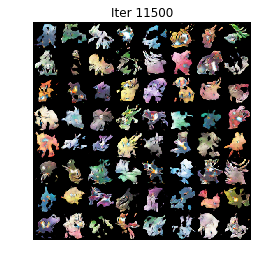

[884/1000][9/13]	Loss_D: -0.9611	Loss_G: 0.5771
[884/1000][10/13]	Loss_D: -0.8680	Loss_G: 0.2090
[884/1000][11/13]	Loss_D: -0.9369	Loss_G: 0.5702
[884/1000][12/13]	Loss_D: -0.9811	Loss_G: 0.4147
[885/1000][0/13]	Loss_D: -1.0091	Loss_G: 0.5466
[885/1000][1/13]	Loss_D: -0.9638	Loss_G: 0.3426
[885/1000][2/13]	Loss_D: -0.9293	Loss_G: 0.5535
[885/1000][3/13]	Loss_D: -0.9401	Loss_G: 0.3530
[885/1000][4/13]	Loss_D: -0.8786	Loss_G: 0.5864
[885/1000][5/13]	Loss_D: -0.9162	Loss_G: 0.2630
[885/1000][6/13]	Loss_D: -0.8596	Loss_G: 0.5804
[885/1000][7/13]	Loss_D: -0.8846	Loss_G: 0.2624
[885/1000][8/13]	Loss_D: -0.8518	Loss_G: 0.5813
[885/1000][9/13]	Loss_D: -0.9172	Loss_G: 0.3805
[885/1000][10/13]	Loss_D: -0.9647	Loss_G: 0.5617
[885/1000][11/13]	Loss_D: -0.9726	Loss_G: 0.3844
[885/1000][12/13]	Loss_D: -0.9450	Loss_G: 0.5503
[886/1000][0/13]	Loss_D: -0.9010	Loss_G: 0.2372
[886/1000][1/13]	Loss_D: -0.9751	Loss_G: 0.5730
[886/1000][2/13]	Loss_D: -1.0215	Loss_G: 0.4612
[886/1000][3/13]	Loss_D: -0.9784	L

[897/1000][10/13]	Loss_D: -0.8570	Loss_G: 0.5727
[897/1000][11/13]	Loss_D: -0.8778	Loss_G: 0.2204
[897/1000][12/13]	Loss_D: -0.8931	Loss_G: 0.5647
[898/1000][0/13]	Loss_D: -1.0149	Loss_G: 0.4227
[898/1000][1/13]	Loss_D: -0.9773	Loss_G: 0.5602
[898/1000][2/13]	Loss_D: -0.9629	Loss_G: 0.3857
[898/1000][3/13]	Loss_D: -0.9659	Loss_G: 0.5683
[898/1000][4/13]	Loss_D: -0.9696	Loss_G: 0.3877
[898/1000][5/13]	Loss_D: -0.9220	Loss_G: 0.5603
[898/1000][6/13]	Loss_D: -0.9828	Loss_G: 0.3767
[898/1000][7/13]	Loss_D: -0.9660	Loss_G: 0.5714
[898/1000][8/13]	Loss_D: -0.9079	Loss_G: 0.2917
[898/1000][9/13]	Loss_D: -0.8914	Loss_G: 0.5789
[898/1000][10/13]	Loss_D: -0.7725	Loss_G: 0.1805
[898/1000][11/13]	Loss_D: -0.7798	Loss_G: 0.5662
[898/1000][12/13]	Loss_D: -0.9706	Loss_G: 0.3802
[899/1000][0/13]	Loss_D: -0.9892	Loss_G: 0.5831
[899/1000][1/13]	Loss_D: -0.9368	Loss_G: 0.3608
[899/1000][2/13]	Loss_D: -0.9274	Loss_G: 0.5764
[899/1000][3/13]	Loss_D: -0.9760	Loss_G: 0.4072
[899/1000][4/13]	Loss_D: -0.9866	L

[910/1000][11/13]	Loss_D: -0.9383	Loss_G: 0.5525
[910/1000][12/13]	Loss_D: -0.8784	Loss_G: 0.2409
[911/1000][0/13]	Loss_D: -0.5632	Loss_G: 0.5795
[911/1000][1/13]	Loss_D: -0.9400	Loss_G: 0.4026
[911/1000][2/13]	Loss_D: -0.9759	Loss_G: 0.5597
[911/1000][3/13]	Loss_D: -0.9445	Loss_G: 0.3692
[911/1000][4/13]	Loss_D: -0.9681	Loss_G: 0.5543
[911/1000][5/13]	Loss_D: -0.9838	Loss_G: 0.4058
[911/1000][6/13]	Loss_D: -1.0091	Loss_G: 0.5734
[911/1000][7/13]	Loss_D: -0.7357	Loss_G: -0.0440
[911/1000][8/13]	Loss_D: -0.9351	Loss_G: 0.5668
[911/1000][9/13]	Loss_D: -0.9679	Loss_G: 0.4150
[911/1000][10/13]	Loss_D: -1.0035	Loss_G: 0.5448
[911/1000][11/13]	Loss_D: -0.9477	Loss_G: 0.3399
[911/1000][12/13]	Loss_D: -0.8901	Loss_G: 0.5804
[912/1000][0/13]	Loss_D: -0.9479	Loss_G: 0.3616
[912/1000][1/13]	Loss_D: -0.9782	Loss_G: 0.5431
[912/1000][2/13]	Loss_D: -0.9306	Loss_G: 0.2867
[912/1000][3/13]	Loss_D: -0.9489	Loss_G: 0.5652
[912/1000][4/13]	Loss_D: -0.9863	Loss_G: 0.3877
[912/1000][5/13]	Loss_D: -0.9998	L

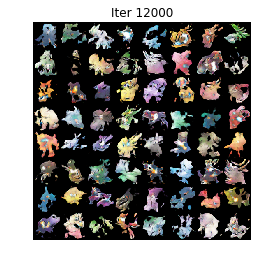

[923/1000][2/13]	Loss_D: -1.0123	Loss_G: 0.4995
[923/1000][3/13]	Loss_D: -0.9871	Loss_G: 0.3929
[923/1000][4/13]	Loss_D: -0.9492	Loss_G: 0.5880
[923/1000][5/13]	Loss_D: -0.9707	Loss_G: 0.3646
[923/1000][6/13]	Loss_D: -0.8248	Loss_G: 0.5589
[923/1000][7/13]	Loss_D: -0.7308	Loss_G: 0.1617
[923/1000][8/13]	Loss_D: -0.9560	Loss_G: 0.5760
[923/1000][9/13]	Loss_D: -0.9780	Loss_G: 0.3999
[923/1000][10/13]	Loss_D: -0.9113	Loss_G: 0.5754
[923/1000][11/13]	Loss_D: -0.9105	Loss_G: 0.3447
[923/1000][12/13]	Loss_D: -0.9139	Loss_G: 0.5771
[924/1000][0/13]	Loss_D: -1.0393	Loss_G: 0.4640
[924/1000][1/13]	Loss_D: -0.9920	Loss_G: 0.5550
[924/1000][2/13]	Loss_D: -0.9559	Loss_G: 0.3395
[924/1000][3/13]	Loss_D: -0.8660	Loss_G: 0.5795
[924/1000][4/13]	Loss_D: -0.9759	Loss_G: 0.3548
[924/1000][5/13]	Loss_D: -0.9527	Loss_G: 0.5646
[924/1000][6/13]	Loss_D: -0.9542	Loss_G: 0.3943
[924/1000][7/13]	Loss_D: -0.8414	Loss_G: 0.5828
[924/1000][8/13]	Loss_D: -0.8132	Loss_G: 0.2571
[924/1000][9/13]	Loss_D: -0.9715	Loss

[936/1000][3/13]	Loss_D: -0.9769	Loss_G: 0.5586
[936/1000][4/13]	Loss_D: -0.8867	Loss_G: 0.2301
[936/1000][5/13]	Loss_D: -0.8603	Loss_G: 0.5824
[936/1000][6/13]	Loss_D: -0.6903	Loss_G: 0.1985
[936/1000][7/13]	Loss_D: -0.9692	Loss_G: 0.5553
[936/1000][8/13]	Loss_D: -0.9722	Loss_G: 0.3981
[936/1000][9/13]	Loss_D: -1.0003	Loss_G: 0.5580
[936/1000][10/13]	Loss_D: -0.9092	Loss_G: 0.2647
[936/1000][11/13]	Loss_D: -0.9408	Loss_G: 0.5474
[936/1000][12/13]	Loss_D: -0.9833	Loss_G: 0.3836
[937/1000][0/13]	Loss_D: -0.9911	Loss_G: 0.5618
[937/1000][1/13]	Loss_D: -0.9790	Loss_G: 0.3955
[937/1000][2/13]	Loss_D: -0.9257	Loss_G: 0.5688
[937/1000][3/13]	Loss_D: -0.9768	Loss_G: 0.3979
[937/1000][4/13]	Loss_D: -0.8600	Loss_G: 0.5884
[937/1000][5/13]	Loss_D: -0.9954	Loss_G: 0.4243
[937/1000][6/13]	Loss_D: -0.9548	Loss_G: 0.5738
[937/1000][7/13]	Loss_D: -0.9100	Loss_G: 0.3318
[937/1000][8/13]	Loss_D: -0.9340	Loss_G: 0.5469
[937/1000][9/13]	Loss_D: -0.9021	Loss_G: 0.3481
[937/1000][10/13]	Loss_D: -0.9616	Los

[949/1000][4/13]	Loss_D: -0.9784	Loss_G: 0.3891
[949/1000][5/13]	Loss_D: -0.9778	Loss_G: 0.5481
[949/1000][6/13]	Loss_D: -0.9344	Loss_G: 0.3434
[949/1000][7/13]	Loss_D: -0.9298	Loss_G: 0.5601
[949/1000][8/13]	Loss_D: -0.9204	Loss_G: 0.3093
[949/1000][9/13]	Loss_D: -0.8852	Loss_G: 0.5778
[949/1000][10/13]	Loss_D: -0.9740	Loss_G: 0.3905
[949/1000][11/13]	Loss_D: -0.9855	Loss_G: 0.5484
[949/1000][12/13]	Loss_D: -0.8617	Loss_G: 0.1261
[950/1000][0/13]	Loss_D: -0.8371	Loss_G: 0.5806
[950/1000][1/13]	Loss_D: -0.9836	Loss_G: 0.4131
[950/1000][2/13]	Loss_D: -0.9333	Loss_G: 0.5672
[950/1000][3/13]	Loss_D: -0.9879	Loss_G: 0.4072
[950/1000][4/13]	Loss_D: -0.9243	Loss_G: 0.5749
[950/1000][5/13]	Loss_D: -0.7210	Loss_G: 0.0826
[950/1000][6/13]	Loss_D: -0.9036	Loss_G: 0.5694
[950/1000][7/13]	Loss_D: -1.0010	Loss_G: 0.4081
[950/1000][8/13]	Loss_D: -0.9828	Loss_G: 0.5678
[950/1000][9/13]	Loss_D: -0.9272	Loss_G: 0.3215
[950/1000][10/13]	Loss_D: -0.9367	Loss_G: 0.5654
[950/1000][11/13]	Loss_D: -0.9637	Lo

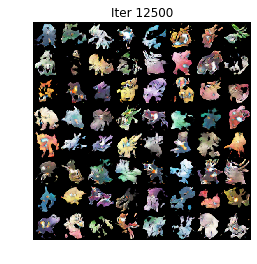

[961/1000][8/13]	Loss_D: -0.8492	Loss_G: 0.1920
[961/1000][9/13]	Loss_D: -0.9459	Loss_G: 0.5672
[961/1000][10/13]	Loss_D: -0.9653	Loss_G: 0.3797
[961/1000][11/13]	Loss_D: -0.8948	Loss_G: 0.5756
[961/1000][12/13]	Loss_D: -0.9351	Loss_G: 0.3754
[962/1000][0/13]	Loss_D: -0.9539	Loss_G: 0.5614
[962/1000][1/13]	Loss_D: -0.9705	Loss_G: 0.3254
[962/1000][2/13]	Loss_D: -0.9513	Loss_G: 0.5635
[962/1000][3/13]	Loss_D: -1.0007	Loss_G: 0.4248
[962/1000][4/13]	Loss_D: -0.9940	Loss_G: 0.5412
[962/1000][5/13]	Loss_D: -0.9413	Loss_G: 0.3027
[962/1000][6/13]	Loss_D: -0.8184	Loss_G: 0.5505
[962/1000][7/13]	Loss_D: -0.9931	Loss_G: 0.4233
[962/1000][8/13]	Loss_D: -1.0140	Loss_G: 0.5359
[962/1000][9/13]	Loss_D: -0.8937	Loss_G: 0.3196
[962/1000][10/13]	Loss_D: -0.9098	Loss_G: 0.5785
[962/1000][11/13]	Loss_D: -0.9404	Loss_G: 0.3398
[962/1000][12/13]	Loss_D: -0.8963	Loss_G: 0.5725
[963/1000][0/13]	Loss_D: -1.0091	Loss_G: 0.4239
[963/1000][1/13]	Loss_D: -0.9645	Loss_G: 0.5395
[963/1000][2/13]	Loss_D: -0.9612	L

[974/1000][9/13]	Loss_D: -0.8795	Loss_G: 0.5776
[974/1000][10/13]	Loss_D: -0.9166	Loss_G: 0.3622
[974/1000][11/13]	Loss_D: -0.9539	Loss_G: 0.5697
[974/1000][12/13]	Loss_D: -1.0249	Loss_G: 0.4531
[975/1000][0/13]	Loss_D: -1.0309	Loss_G: 0.5357
[975/1000][1/13]	Loss_D: -0.8974	Loss_G: 0.3309
[975/1000][2/13]	Loss_D: -0.8761	Loss_G: 0.5475
[975/1000][3/13]	Loss_D: -0.8818	Loss_G: 0.3829
[975/1000][4/13]	Loss_D: -0.9764	Loss_G: 0.5691
[975/1000][5/13]	Loss_D: -0.9514	Loss_G: 0.3686
[975/1000][6/13]	Loss_D: -0.9568	Loss_G: 0.5598
[975/1000][7/13]	Loss_D: -0.9784	Loss_G: 0.3506
[975/1000][8/13]	Loss_D: -0.9367	Loss_G: 0.5725
[975/1000][9/13]	Loss_D: -0.9187	Loss_G: 0.3606
[975/1000][10/13]	Loss_D: -0.9782	Loss_G: 0.5583
[975/1000][11/13]	Loss_D: -0.9938	Loss_G: 0.3869
[975/1000][12/13]	Loss_D: -0.9620	Loss_G: 0.5656
[976/1000][0/13]	Loss_D: -0.9530	Loss_G: 0.3642
[976/1000][1/13]	Loss_D: -0.9438	Loss_G: 0.5812
[976/1000][2/13]	Loss_D: -0.9122	Loss_G: 0.2477
[976/1000][3/13]	Loss_D: -0.8144	L

[987/1000][10/13]	Loss_D: -0.9027	Loss_G: 0.3159
[987/1000][11/13]	Loss_D: -0.8882	Loss_G: 0.5759
[987/1000][12/13]	Loss_D: -1.0243	Loss_G: 0.4310
[988/1000][0/13]	Loss_D: -1.0205	Loss_G: 0.5469
[988/1000][1/13]	Loss_D: -1.0351	Loss_G: 0.4582
[988/1000][2/13]	Loss_D: -1.0313	Loss_G: 0.5052
[988/1000][3/13]	Loss_D: -0.9825	Loss_G: 0.4081
[988/1000][4/13]	Loss_D: -0.8679	Loss_G: 0.5786
[988/1000][5/13]	Loss_D: -0.8720	Loss_G: 0.1688
[988/1000][6/13]	Loss_D: -0.9128	Loss_G: 0.5728
[988/1000][7/13]	Loss_D: -0.9190	Loss_G: 0.2141
[988/1000][8/13]	Loss_D: -0.9585	Loss_G: 0.5509
[988/1000][9/13]	Loss_D: -1.0056	Loss_G: 0.4149
[988/1000][10/13]	Loss_D: -0.9801	Loss_G: 0.5601
[988/1000][11/13]	Loss_D: -0.8902	Loss_G: 0.2151
[988/1000][12/13]	Loss_D: -0.8902	Loss_G: 0.5650
[989/1000][0/13]	Loss_D: -0.9538	Loss_G: 0.3414
[989/1000][1/13]	Loss_D: -0.9090	Loss_G: 0.5626
[989/1000][2/13]	Loss_D: -0.9696	Loss_G: 0.3462
[989/1000][3/13]	Loss_D: -0.9642	Loss_G: 0.5526
[989/1000][4/13]	Loss_D: -0.9458	L

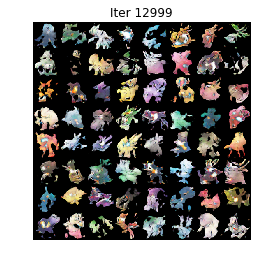

In [11]:
# Создали генератор
netG = Generator().to(device)

# Инициализировали его
netG.apply(weights_init)

# Вывели модель для отладки
print(netG)

# Создали дискриминатор
netD = Discriminator().to(device)

# Ининциализировали весе
netD.apply(weights_init)

# Вывели модель для отладки
print(netD)

# Фиксированный шум для мониторинга качества генерации
fixed_noise = torch.randn(batch_size, num_hidden, 1, 1, device=device)

# Коэффициент обучения
lr = 0.00005

# Оптимизаторы для сеток
optimizerD = optim.RMSprop(netD.parameters(), lr=lr)
optimizerG = optim.RMSprop(netG.parameters(), lr=lr)

# Training Loop

def train_discriminator(real_images, fake_images):
    netD.zero_grad()
    real_score = netD(real_images).view(-1)
    fake_score = netD(fake_images.detach()).view(-1)
    d_loss = -(torch.mean(real_score) - torch.mean(fake_score))
    d_loss.backward()
    optimizerD.step()

    for theta in netD.parameters():
        theta.data.clamp_(-0.01, 0.01)

    netD.zero_grad()
    return d_loss


def train_generator(batch_size):
    netG.zero_grad()
    noise = torch.randn(batch_size, num_hidden, 1, 1, device=device)
    # Generate fake image batch with G
    fake_images = netG(noise)
    output = netD(fake_images).view(-1)
    g_loss = -torch.mean(output)
    g_loss.backward()
    optimizerG.step()
    return g_loss
        

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, (data,_) in enumerate(dataloader, 0):
        for _ in range(5):
            # обучаем дискриминатор
            # d_loss = wasserstein loss дискриминатора
            # real_score - оценки дискриминатора для настоящих картинок
            # fake_score - оценки дискриминатора для фейковых картинок
            # помните, что на одну итерацию обучения генератора
            # должно приходиться несколько итераций обучения дискриминатора!
            
            real_images = data.to(device)
            noise = torch.randn(real_images.size(0), num_hidden, 1, 1, device=device)
            fake_images = netG(noise)
            d_loss = train_discriminator(real_images, fake_images)
            
        g_loss = train_generator(data.size(0))
        # Output training stats
        if i % 1 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                  % (epoch, num_epochs, i, len(dataloader), d_loss, g_loss))

        # Save Losses for plotting later
        G_losses.append(g_loss.item())
        D_losses.append(d_loss.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            plt.axis("off")
            plt.title("Iter {}".format(iters))
            plt.imshow(np.transpose(img_list[-1],(1,2,0)))
            plt.show()
            plt.close()

        iters += 1
    if epoch % 25 == 0:
        torch.save(netG, "models/64/netG_{}.pt".format(epoch))
        torch.save(netD, "models/64/netD_{}.pt".format(epoch))

In [12]:
torch.save(netG, "models/64/netG_1000.pt")
torch.save(netD, "models/64/netD_1000.pt")

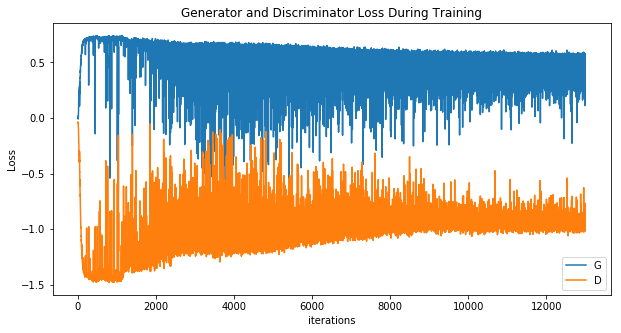

In [13]:
# Выводим на печать всяческие loss'ы
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

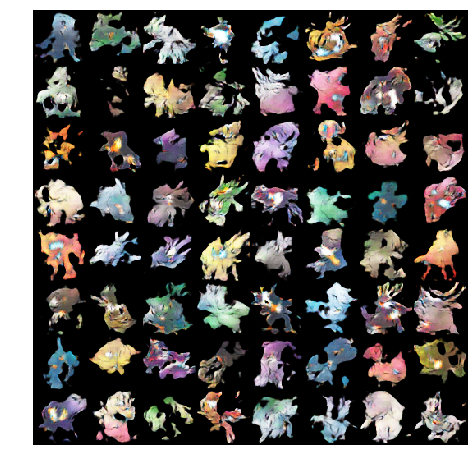

In [14]:
# Проигрываем результаты генерации для фиксированного шума
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

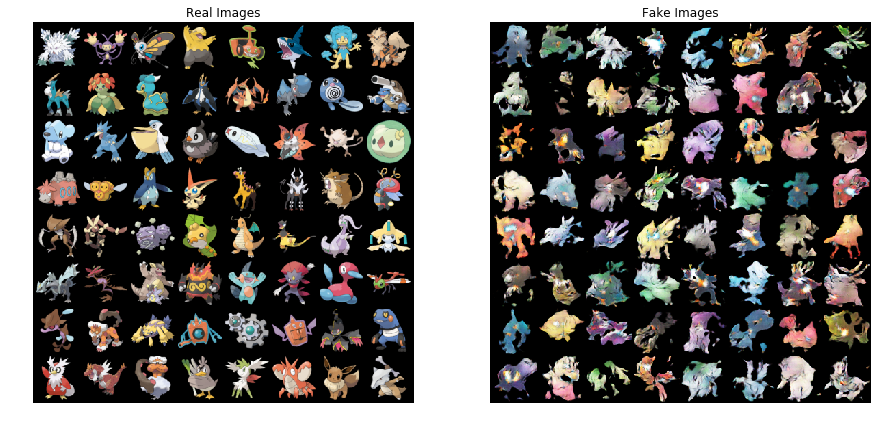

In [15]:
# Сравниваем настоящие данные и генерацию
real_batch = next(iter(dataloader))

# Рисуем трейнсет
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Рисуем фейки
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()